# About  Project 

- The objective of this project is to find whether employee has to be `promoted or not`.
- Dataset consists of several Professional Variables(Independent) and one Outcome Variable(Dependent)
- The independent variables in this data set are :- 
  'employee_id', 'department', 'region',education','gender','recruitment_channel', 'no_of_trainings', 'age',
  'previous_year_rating','length_of_service', 'KPIs_met >80%', 'awards_won?','avg_training_score'.
- The outcome variable value is either 1 or 0 indicating whether a employee has  to be promoted(1) or not(0).

# About the Dataset

- employee_id :- Employee id which is individual
- department :- Different department in the company
- region :- Different region of the employee
- education :- Education of the employee in the company
- gender :- Male or Female 
- recruitment_channel :- From where employee will recruitment to the company
- no_of_trainings :- How much trainings of the employee
- age :- Age of the employee in the company
- previous_year_rating :- Ratings to the employees in previous year
- length_of_service :- Work experience of employee
- KPIs_met >80% :- KPIs met or not
- awards_won? :- Awards win by the employee in the company
- avg_training_score :-Average training score of the employee


<a class="anchor" id="0.1"></a>

# Table of Contents

1. [**Installing Libraries**](#1)


1. [**Importing  Libraries**](#2)


1. [**Loading  the  Dataset**](#3)


1. [**Exploratory  Data  Analysis**](#4)

    ##### A. Understanding the dataset
      - Head :- display the top 5 data records
      - Info :- summary of a dataset
      - Column :- learning about the columns
      - Shape :- shape of dataset
      - Nunique :- unique value in each column
      - Describe :- helps us to understand how data has been spread across the table
      
    ##### B. Data Cleaning
      - Drop_duplicates :- dropping duplicate values
      - Isna :- check for missing values
      - msno :- visualizing the null values using missingo function
         

1. [**Data  Visualization**](#5)
  
   ##### A. General Visualization
      - Countplot :- to see if the dataset is balanced or not
      - Histplot :- to see if data is normally distributed or skewed
      - Pair plot :- to create scatter plot between all the variables
      - Heatmap :- to find correlation between the variables
 
   ##### B.Univariate Visualization
      - To see insights of independent variable individually.
  
   ##### C.Bivariate Visualization
      - To find out insights of the independent variable with dependent variable what is relation between them.


1. [**Data Pre-processing**](#6)
      - Handling missing values
      - Droping unneccessary Columns
      - Split the train dataset into independent variable and dependent variable
      - Encoding Categorical Data
      - Handling imbalance dataset
      - Splitng the Train Data into Train & Validation set
      - Scaling dataset


1. [**Build  the  Classification  Algorithm**](#7)

    7.1  KNN

    7.2  Decision Tree

    7.3  Random Forest

    7.4  SVM

    7.5  Logistic Regression
    
    7.6  Naive Bayes
    
    7.7 Bagging
    
    7.8 AdaBoasting
    
    7.9 XGBoasting

   #### The models include the following:- 

    a. Hyper Parameter Tuning using RandmizedSearchCV 
  
    b. Fit Best Model
  
    c. Predict on validation data using that model
  
    d. Performance Metrics :- Confusion Matrix, F1 Score, Precision Score, Recall Score,Classification Report
   

1. [**Using best model prediction on test dataset**](#8)


1. [**Using Lazypredict**](#9) 

1. [**Using Artificial Neural Network**](#10)

1. [**Using LSTM**](#11)
  
1. [**Result  and  Conclusion**](#12)



# 1. Installing  Libraries <a class="anchor" id="1"></a>
​
[Table of Contents](#0.1)

In [1]:
pip install pandas_profiling  #To get general overview 

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install missingno  #To get missing value in terms of visualization

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install category_encoders  #To convert categorical data into numerical

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install imblearn  #To handle imbalance data

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install lazypredict  #To get overall prediction in one go

Note: you may need to restart the kernel to use updated packages.


# 2. Importing Libraries <a class="anchor" id="2"></a>
​
[Table of Contents](#0.1)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import ydata_profiling as pp
import lazypredict
from lazypredict.Supervised import LazyClassifier
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

# 3. Loading the Dataset <a class="anchor" id="3"></a>

[Table of Contents](#0.1)

In [2]:
train_data = pd.read_csv("HR analysis case study dataset/train.csv")
test_data = pd.read_csv("HR analysis case study dataset/test.csv")

In [3]:
train_profile = pp.ProfileReport(train_data)
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
test_profile = pp.ProfileReport(test_data)
test_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 4. Exploratory Data Analysis <a class="anchor" id="4"></a>

[Table of Contents](#0.1)

### A. Understanding the dataset

In [5]:
train_data.head() #get familier with train dataset, display the top 5 data records

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.00,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.00,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.00,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.00,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.00,2,0,0,73,0


In [6]:
train_data.info() #Print a concise summary of a DataFrame. This method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [7]:
train_data.columns #learning about the columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [8]:
train_data.shape #getting to know about rows and columns we're dealing with - 54808 rows , 14 columns

(54808, 14)

In [9]:
train_data.nunique() # Unique value in each column

employee_id             54808
department                  9
region                     34
education                   3
gender                      2
recruitment_channel         3
no_of_trainings            10
age                        41
previous_year_rating        5
length_of_service          35
KPIs_met >80%               2
awards_won?                 2
avg_training_score         61
is_promoted                 2
dtype: int64

In [10]:
train_data.describe() #helps us to understand how data has been spread across the table.

# count :- the number of Non-empty rows in a feature.
# mean :- mean value of that feature.
# std :- Standard Deviation Value of that feature.
# min :- minimum value of that feature.
# max :- maximum value of that feature.
# 25%, 50%, and 75% are the percentile/quartile of each features. 

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.00,54808.00,54808.00,50684.00,54808.00,54808.00,54808.00,54808.00,54808.00
mean,39195.83,1.25,34.80,3.33,5.87,0.35,0.02,63.39,0.09
std,22586.58,0.61,7.66,1.26,4.27,0.48,0.15,13.37,0.28
min,1.00,1.00,20.00,1.00,1.00,0.00,0.00,39.00,0.00
25%,19669.75,1.00,29.00,3.00,3.00,0.00,0.00,51.00,0.00
50%,39225.50,1.00,33.00,3.00,5.00,0.00,0.00,60.00,0.00
75%,58730.50,1.00,39.00,4.00,7.00,1.00,0.00,76.00,0.00
max,78298.00,10.00,60.00,5.00,37.00,1.00,1.00,99.00,1.00


In [11]:
test_data.head() #get familier with test dataset, display the top 5 data records

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.00,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.00,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.00,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.00,7,0,0,61


In [12]:
test_data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           23490 non-null  int64  
 1   department            23490 non-null  object 
 2   region                23490 non-null  object 
 3   education             22456 non-null  object 
 4   gender                23490 non-null  object 
 5   recruitment_channel   23490 non-null  object 
 6   no_of_trainings       23490 non-null  int64  
 7   age                   23490 non-null  int64  
 8   previous_year_rating  21678 non-null  float64
 9   length_of_service     23490 non-null  int64  
 10  KPIs_met >80%         23490 non-null  int64  
 11  awards_won?           23490 non-null  int64  
 12  avg_training_score    23490 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 2.3+ MB


In [13]:
test_data.shape #getting to know about rows and columns we're dealing with - 23490 rows , 13 columns

(23490, 13)

In [14]:
test_data.nunique()

employee_id             23490
department                  9
region                     34
education                   3
gender                      2
recruitment_channel         3
no_of_trainings             9
age                        41
previous_year_rating        5
length_of_service          34
KPIs_met >80%               2
awards_won?                 2
avg_training_score         61
dtype: int64

In [15]:
test_data.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
count,23490.00,23490.00,23490.00,21678.00,23490.00,23490.00,23490.00,23490.00
mean,39041.40,1.25,34.78,3.34,5.81,0.36,0.02,63.26
std,22640.81,0.60,7.68,1.26,4.21,0.48,0.15,13.41
min,3.00,1.00,20.00,1.00,1.00,0.00,0.00,39.00
25%,19370.25,1.00,29.00,3.00,3.00,0.00,0.00,51.00
50%,38963.50,1.00,33.00,3.00,5.00,0.00,0.00,60.00
75%,58690.00,1.00,39.00,4.00,7.00,1.00,0.00,76.00
max,78295.00,9.00,60.00,5.00,34.00,1.00,1.00,99.00


### B. Data Cleaning

In [16]:
train_data.drop_duplicates () #dropping duplicate values - checking if there are any duplicate rows and dropping if any

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.00,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.00,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.00,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.00,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.00,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.00,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.00,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.00,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.00,2,0,0,45,0


In [17]:
train_data.isna().sum() #check for missing values, count them and print the sum for every column

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

<AxesSubplot: >

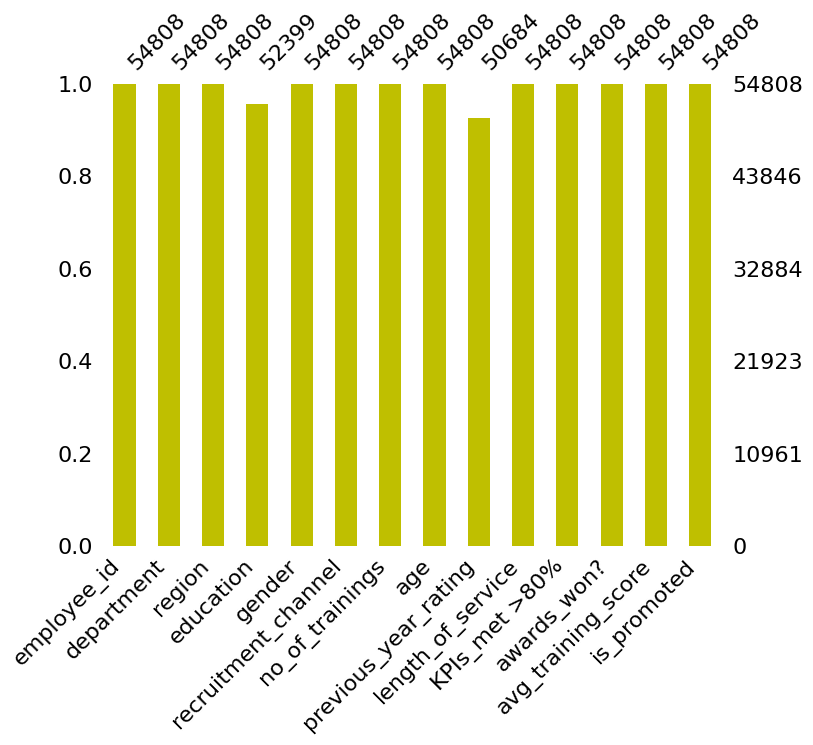

In [18]:
# Visualizing the null values using missingo function

msno.bar(train_data, color = 'y', figsize = (8,6))  # Check the missing values in train data

**Conclusion:-**
    
In `Education & Previous year rating` their is missing value present. We have to handle it.

In [19]:
test_data.drop_duplicates ()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.00,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.00,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.00,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.00,7,0,0,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23485,53478,Legal,region_2,Below Secondary,m,sourcing,1,24,3.00,1,0,0,61
23486,25600,Technology,region_25,Bachelor's,m,sourcing,1,31,3.00,7,0,0,74
23487,45409,HR,region_16,Bachelor's,f,sourcing,1,26,4.00,4,0,0,50
23488,1186,Procurement,region_31,Bachelor's,m,sourcing,3,27,NaN,1,0,0,70


In [20]:
test_data.isna().sum()

employee_id                0
department                 0
region                     0
education               1034
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    1812
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

<AxesSubplot: >

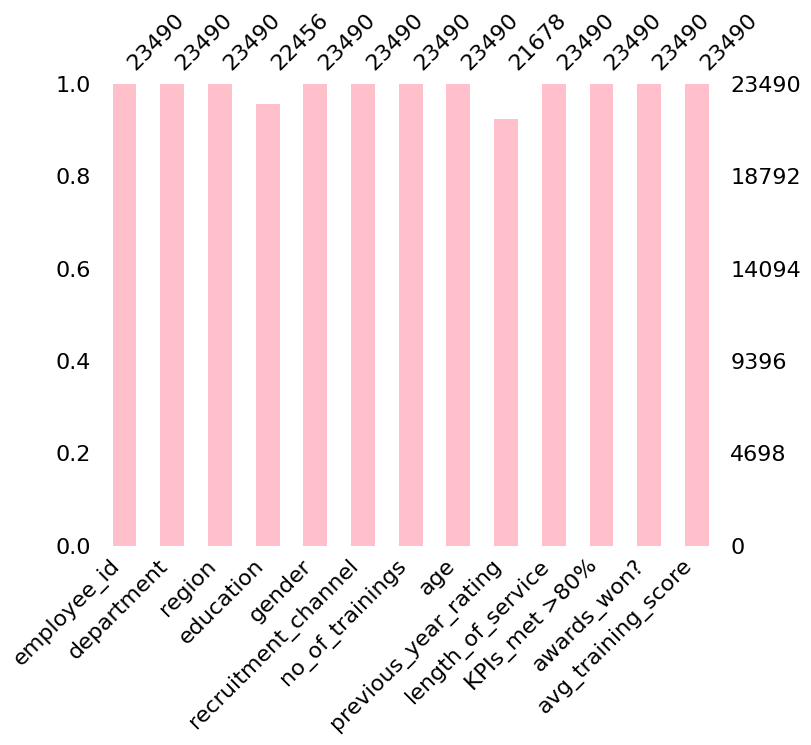

In [21]:
msno.bar(test_data, color = 'pink', figsize = (8,6))  ## Check the missing values in test data

**Conclusion:-**
    
Similar to train dataset here also missing value present in `education & previous year rating`.So we have to handle it.

# 5. Data Visualization <a class="anchor" id="5"></a>

[Table of Contents](#0.1)

###  A.General Visualization

In [22]:
train_data["is_promoted"].value_counts() #Get count of each class

0    50140
1     4668
Name: is_promoted, dtype: int64

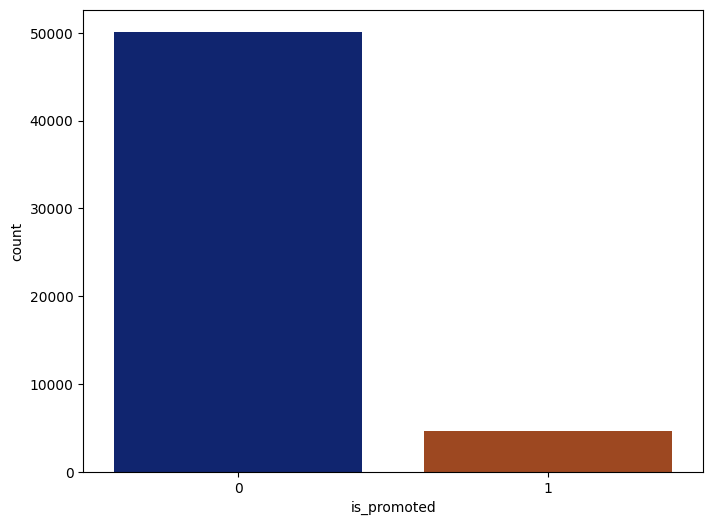

In [23]:
plt.subplots(figsize=(8,6))
sns.countplot(x = 'is_promoted', data = train_data,palette = 'dark')
plt.show()

**Conclusion:-**
    
From the above graph we can see that our dependent column is `imbalnance`.

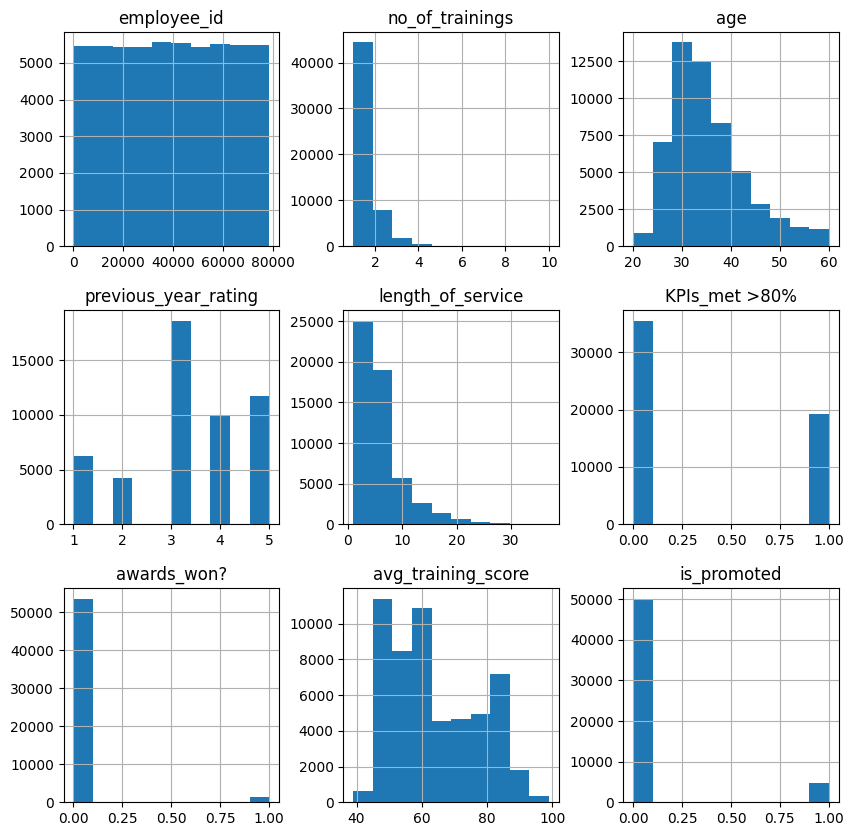

In [24]:
train_data.hist(bins=10,figsize=(10,10))
plt.show()

**Conclusion:-**
    
We can see that age and length of service are `left skewed`.

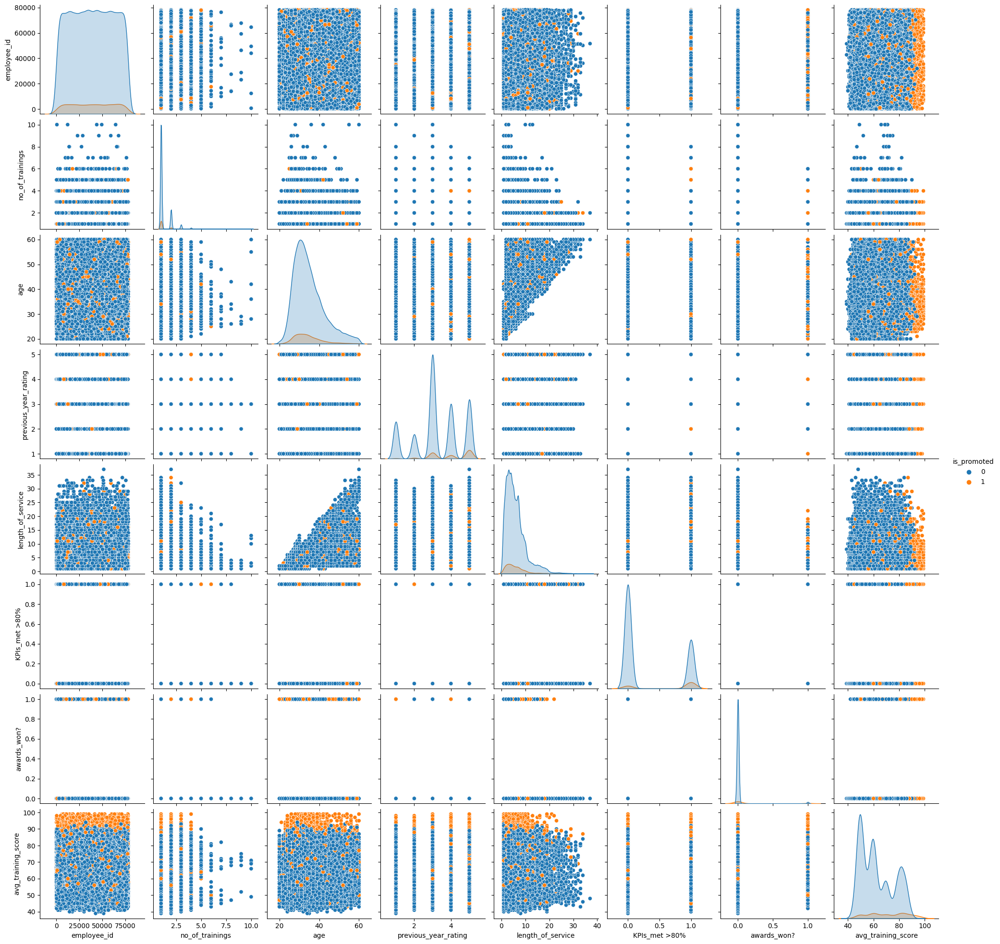

In [25]:
sns.pairplot(train_data,hue="is_promoted")

<AxesSubplot: >

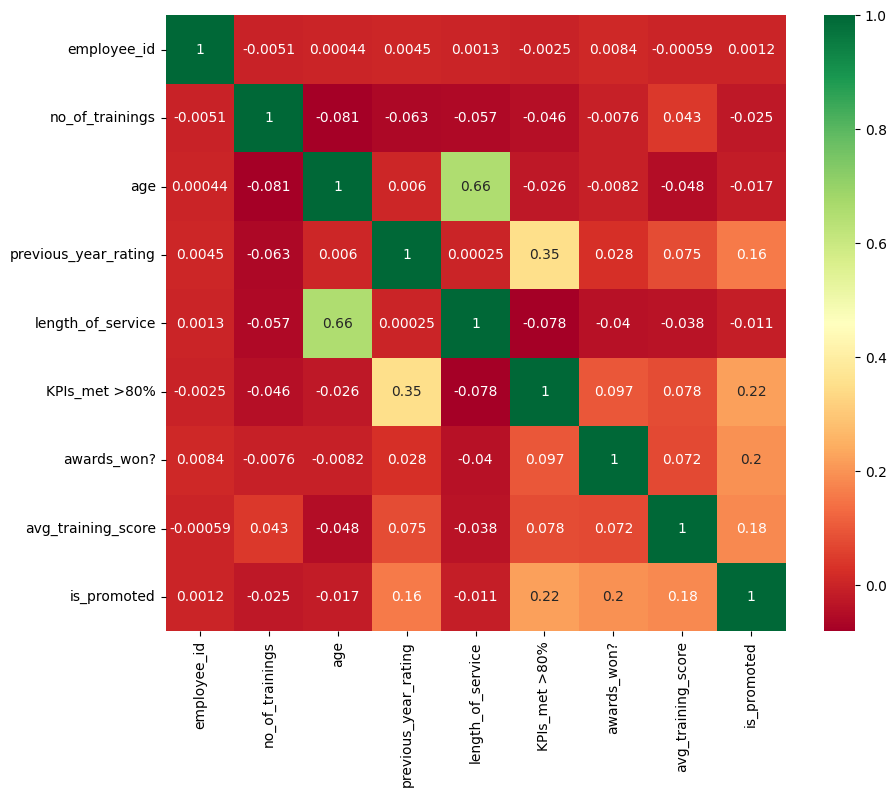

In [26]:
plt.figure(figsize=(10,8))
sns.heatmap(train_data.corr(), annot=True, cmap="RdYlGn")

**Conclusion:-**
    
We can see that age and length of service are `highly correlated` to each other.

###  B.Univariate Visualization

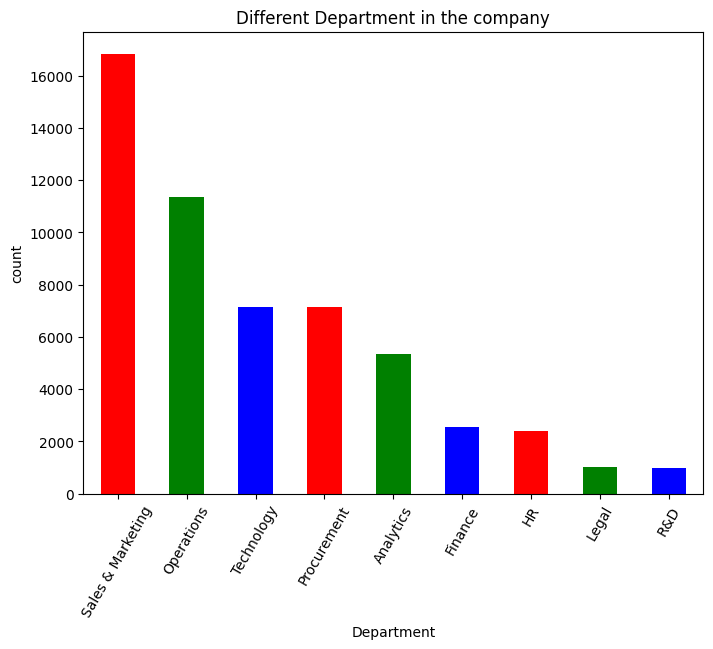

In [27]:
plt.subplots(figsize=(8,6))
train_data['department'].value_counts().plot.bar(color=[ 'red', 'green', 'blue'])
plt.title('Different Department in the company')
plt.xticks(rotation = 60)
plt.xlabel('Department')
plt.ylabel('count')
plt.show()
plt.show()

**Conclusion:-**
    
`Sales & Marketing` department have maximum number of employee.

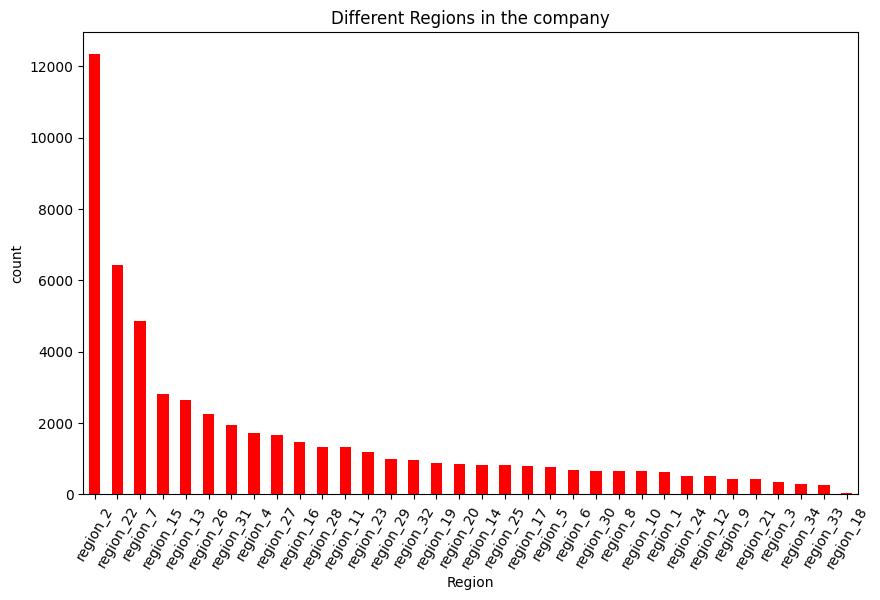

In [28]:
# checking the different regions of the company

plt.subplots(figsize=(10,6))
train_data['region'].value_counts().plot.bar(color = 'red')
plt.title('Different Regions in the company')
plt.xticks(rotation = 60)
plt.xlabel('Region')
plt.ylabel('count')
plt.show()

**Conclusion:-**
    
Region 2 has `maximum` employee among all of the regions.

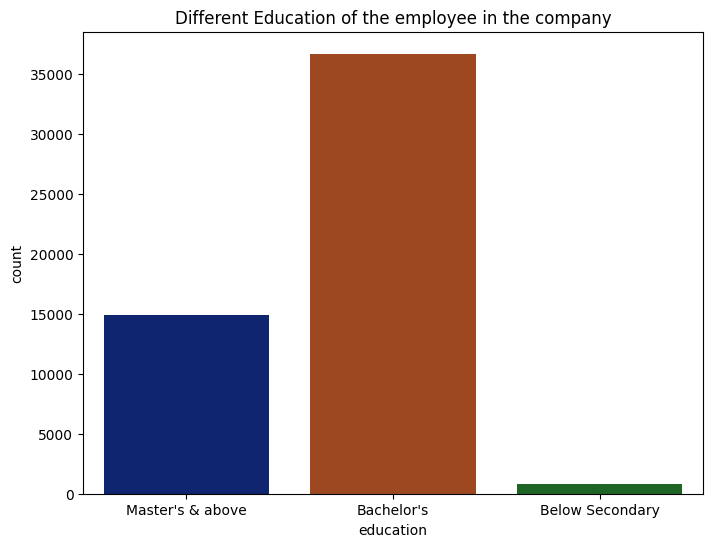

In [29]:
plt.subplots(figsize=(8,6))
sns.countplot(x = 'education', data = train_data, palette = 'dark')
plt.title('Different Education of the employee in the company')
plt.xlabel('education')
plt.ylabel('count')
plt.show()

**Conclusion:-**
    
In the company their are less number of employee who are `below secondary`.

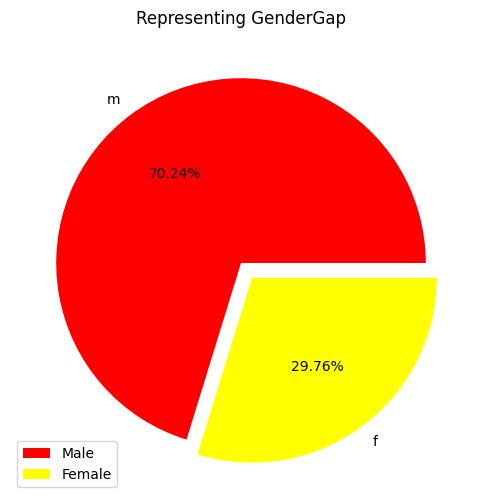

In [30]:
plt.subplots(figsize=(8,6))
plt.pie(train_data['gender'].value_counts().values, labels = train_data['gender'].value_counts().index, colors = ['red','yellow'], explode = [0, 0.1],autopct = "%.2f%%")
plt.title('Representing GenderGap')
plt.legend(['Male','Female'])
plt.show()

**Conclusion:-**
    
`Male` has maximum number of employees as compare to female in the company.

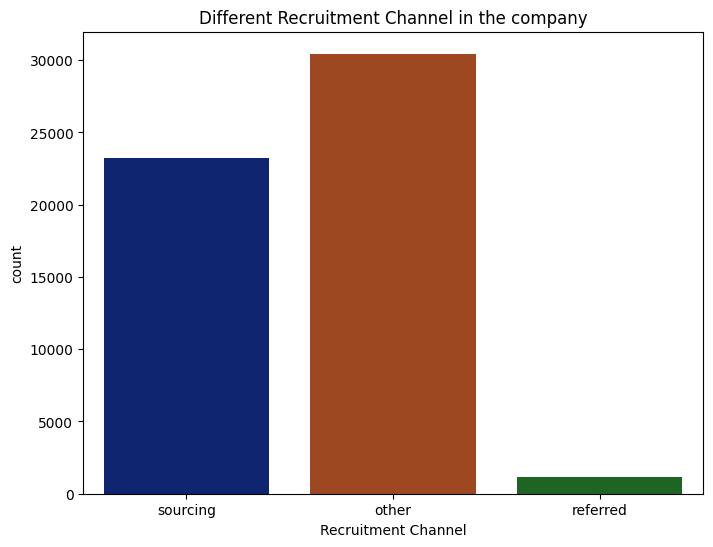

In [31]:
plt.subplots(figsize=(8,6))
sns.countplot(x = 'recruitment_channel', data = train_data,palette = 'dark')
plt.title('Different Recruitment Channel in the company')
plt.xlabel('Recruitment Channel')
plt.ylabel('count')
plt.show()

**Conclusion:-**
    
From referred recruitment channel their is less number of employee are `higher`.

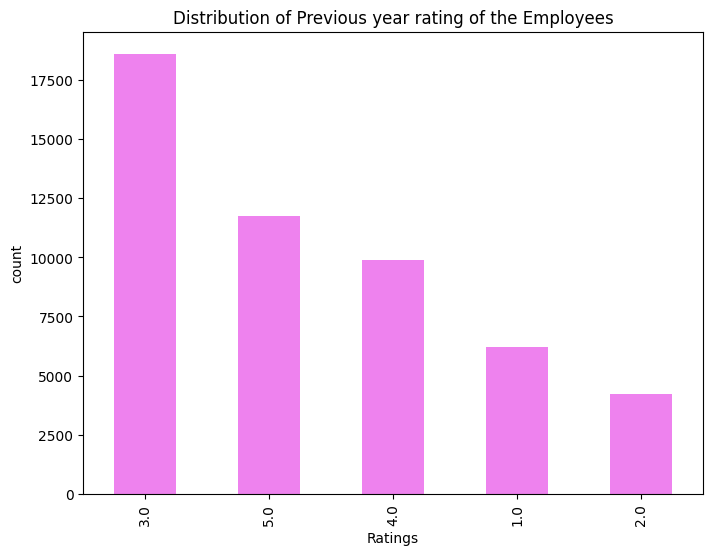

In [32]:
plt.subplots(figsize=(8,6))
train_data['previous_year_rating'].value_counts().plot.bar(color = 'violet')
plt.title('Distribution of Previous year rating of the Employees')
plt.xlabel('Ratings')
plt.ylabel('count')
plt.show()

**Conclusion:-**
    
Large number of employees gets `3.0 rating` in previous year of the company.

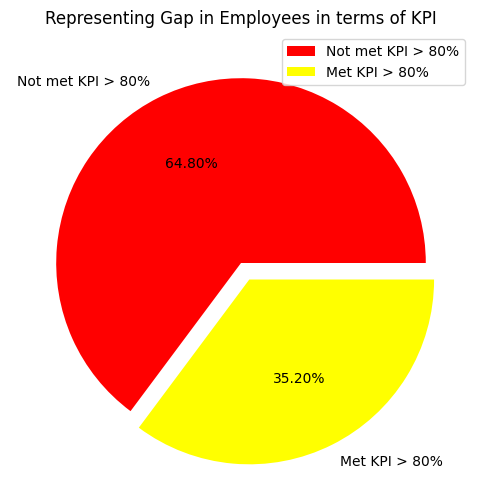

In [33]:
plt.subplots(figsize=(8,6))
plt.pie(train_data['KPIs_met >80%'].value_counts().values, labels = ['Not met KPI > 80%','Met KPI > 80%'], colors = ['red','yellow'], explode = [0, 0.1],autopct = "%.2f%%")
plt.title('Representing Gap in Employees in terms of KPI')
plt.legend(['Not met KPI > 80%','Met KPI > 80%'])
plt.show()

**Conclusion:-**
    
Most of the employees `not met KPI>80%`.

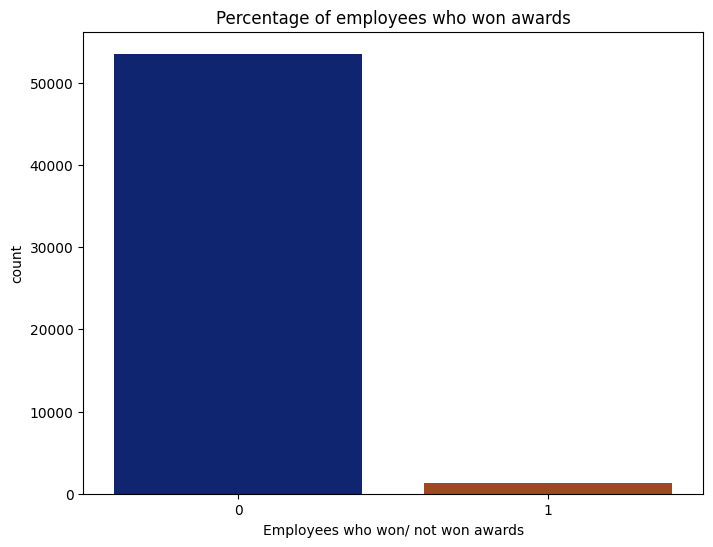

In [34]:
plt.subplots(figsize=(8,6))
sns.countplot(x = 'awards_won?', data = train_data,palette = 'dark')
plt.title('Percentage of employees who won awards')
plt.xlabel('Employees who won/ not won awards')
plt.ylabel('count')
plt.show()

**Conclusion:-**
    
Very less number of employees `not won any award` in the company.

### C.Bivariate Visualization

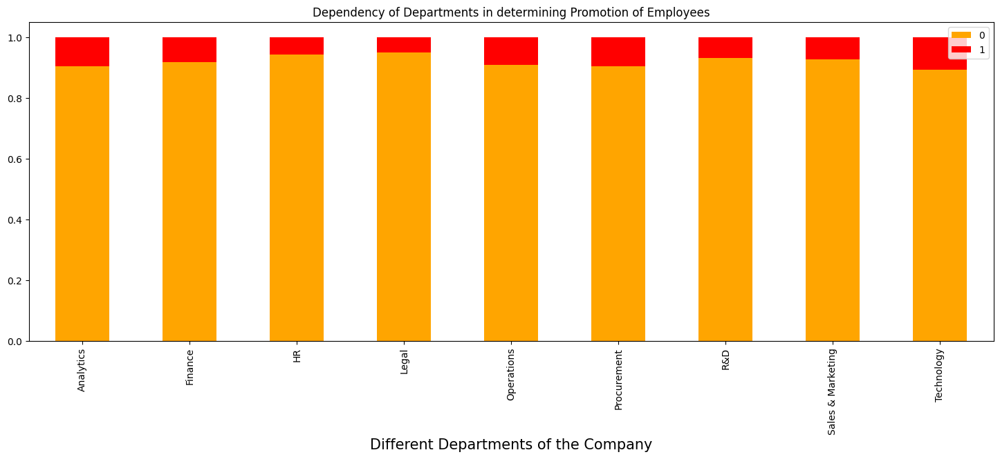

In [35]:
# checking which department got larger number of promotions

data = pd.crosstab(train_data['department'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (18, 6), color = ['orange', 'red'])

plt.title('Dependency of Departments in determining Promotion of Employees')
plt.xlabel('Different Departments of the Company',fontsize=15)
plt.legend()
plt.show()

**Conclusion:-**
    
 Each of the departments have `equal number of promotions` showing an equal improment in each of the departments of the company.

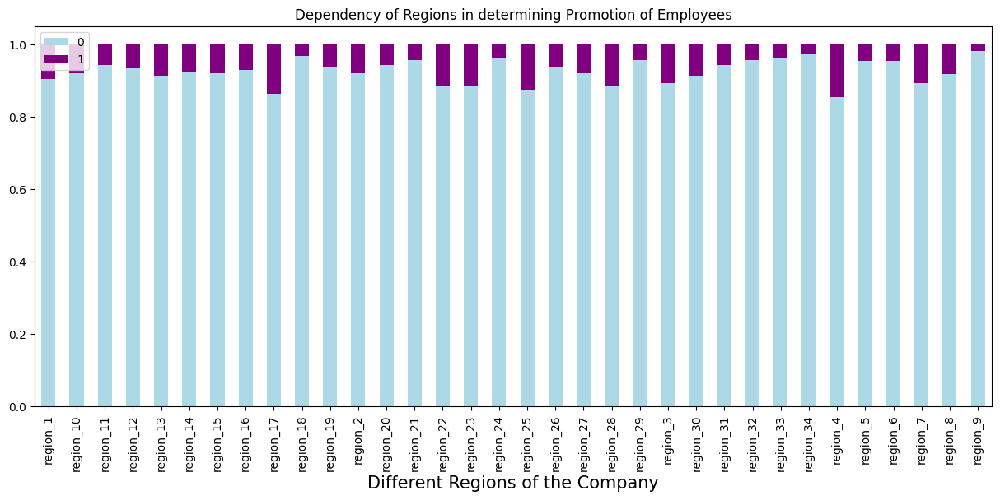

In [36]:
# checking dependency of different regions in promotion

data = pd.crosstab(train_data['region'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['lightblue', 'purple'])

plt.title('Dependency of Regions in determining Promotion of Employees')
plt.xlabel('Different Regions of the Company', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
There is `no biasedness` against regions in terms of Promotion as all the regions have almost equally promotions.

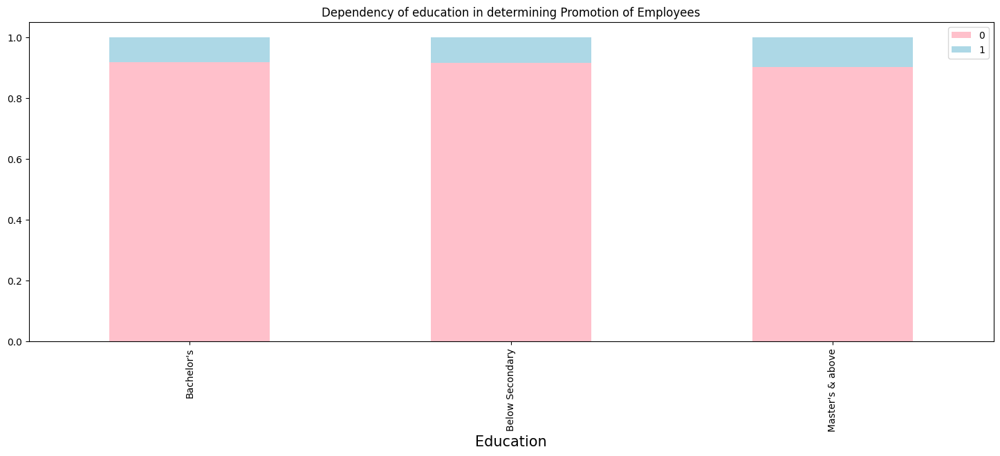

In [37]:
# checking dependency of education over promotion

data = pd.crosstab(train_data['education'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (18,6), color = ['pink', 'lightblue'])

plt.title('Dependency of education in determining Promotion of Employees')
plt.xlabel('Education',fontsize=15)
plt.legend()

**Conclusion:-**
    
Education background `does not affect` on promotion.

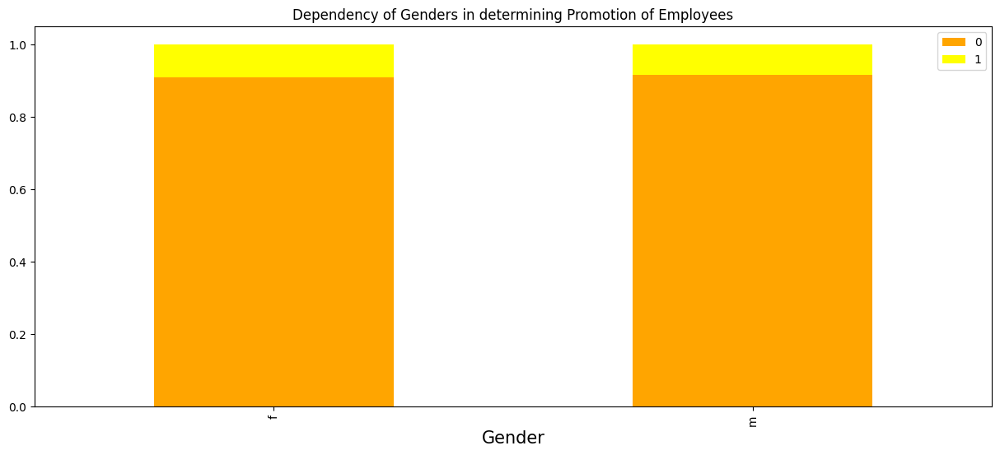

In [38]:
# checking dependency of gender over promotion

data = pd.crosstab(train_data['gender'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['orange', 'yellow'])

plt.title('Dependency of Genders in determining Promotion of Employees')
plt.xlabel('Gender', fontsize = 15)
plt.legend()

**Conclusion:-**
    
There is no partiality between `Males` and `Females` in terms of promotion.

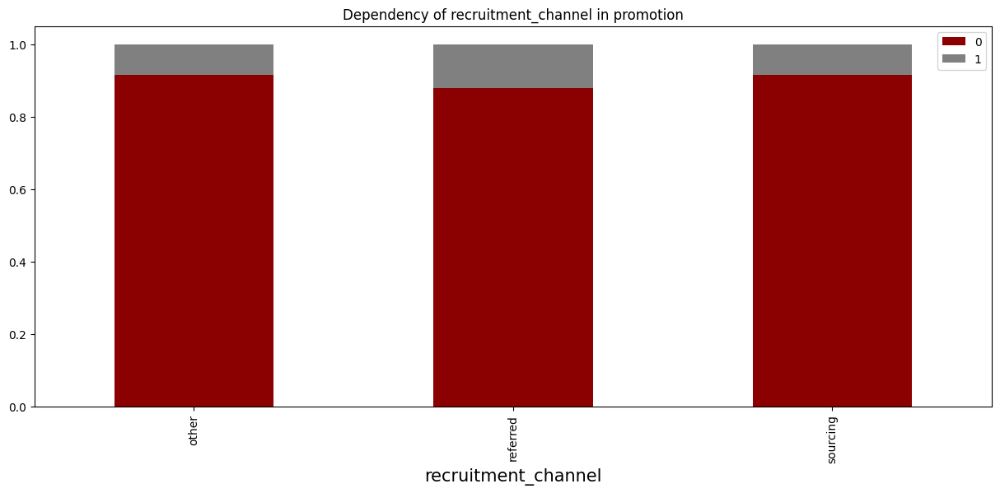

In [39]:
data = pd.crosstab(train_data['recruitment_channel'], train_data['is_promoted'])
data.div(data.sum(1),axis=0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['darkred','grey'])

plt.title('Dependency of recruitment_channel in promotion')
plt.xlabel('recruitment_channel', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
There is `no partiality` between any recruitment channel to give promotion.

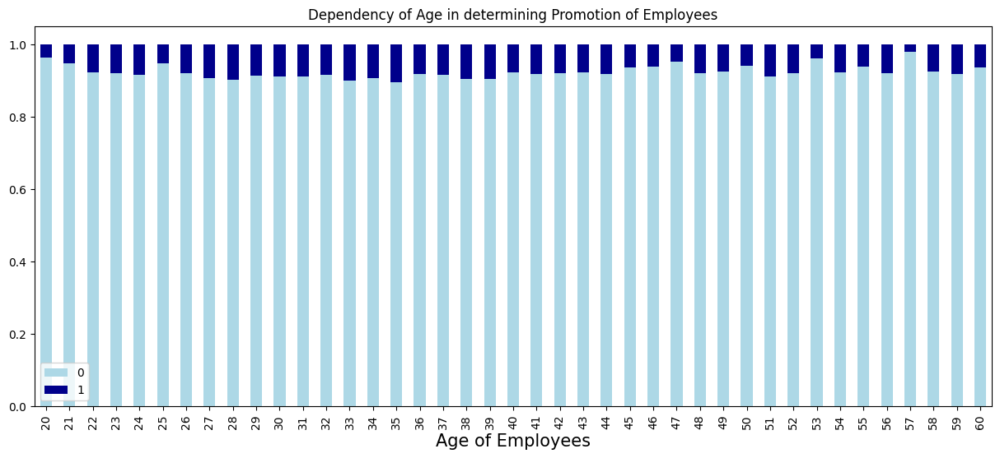

In [40]:
# checking dependency of age factor in promotion of employees

data = pd.crosstab(train_data['age'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['lightblue', 'darkblue'])

plt.title('Dependency of Age in determining Promotion of Employees')
plt.xlabel('Age of Employees', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
The company promotes employees of `all the ages equally` even the freshers have equal share of promotion and also the senior citizen employees have equal share of Promotion in the Company.

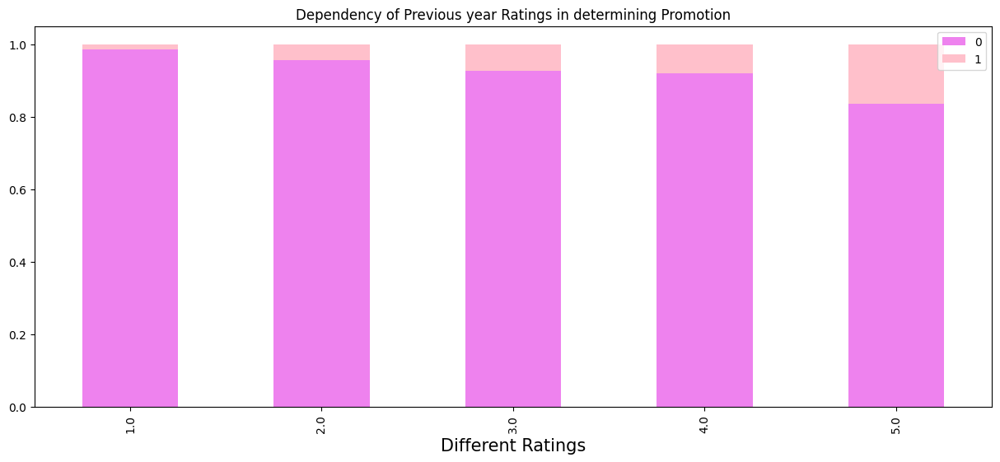

In [41]:
# checking dependency on previous years ratings

data = pd.crosstab(train_data['previous_year_rating'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 6), color = ['violet', 'pink'])

plt.title('Dependency of Previous year Ratings in determining Promotion')
plt.xlabel('Different Ratings', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
Previous ratings matter a lot, if the ratings are high, the chances of being promoted in the company `increases`.

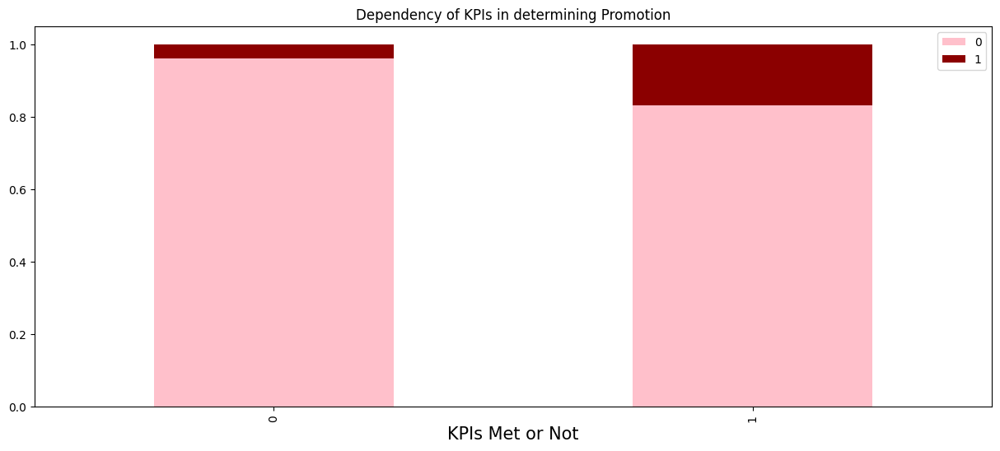

In [42]:
#dependency of KPIs with Promotion

data = pd.crosstab(train_data['KPIs_met >80%'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['pink', 'darkred'])

plt.title('Dependency of KPIs in determining Promotion')
plt.xlabel('KPIs Met or Not', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
A good KPI score `increases` the chances of getting promoted in the company.

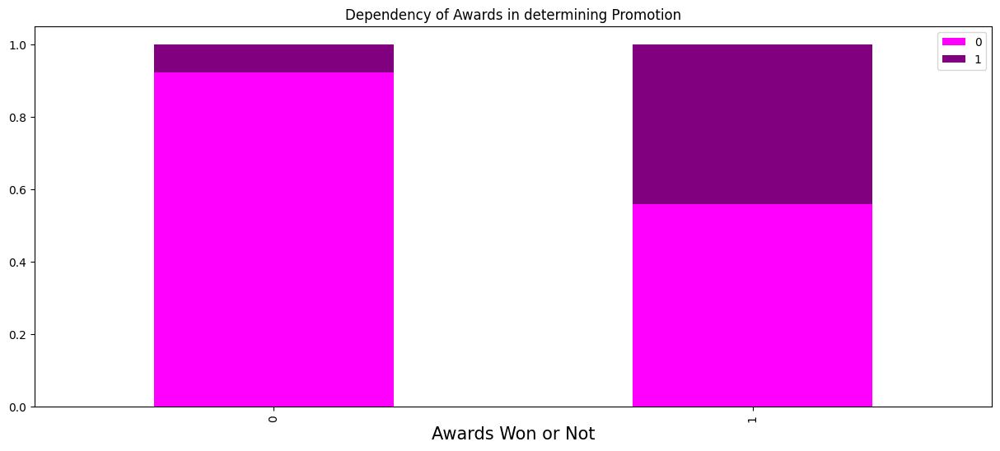

In [43]:
# dependency of awards won on promotion

data = pd.crosstab(train_data['awards_won?'], train_data['is_promoted'])
data.div(data.sum(1), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15,6), color = ['magenta', 'purple'])

plt.title('Dependency of Awards in determining Promotion')
plt.xlabel('Awards Won or Not', fontsize = 15)
plt.legend()
plt.show()

**Conclusion:-**
    
There is a very good chance of getting promoted if the employee has `won an award`.

# 6. Data Pre-processing <a class="anchor" id="6"></a>

[Table of Contents](#0.1)

### A.Handling Missing Values

In [3]:
# filling missing values of train data set

train_data['education'].fillna(train_data['education'].mode()[0], inplace = True)
train_data['previous_year_rating'].fillna(train_data['previous_year_rating'].median(), inplace = True)

# again checking if there is any Null value left in the data
train_data.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

In [4]:
# filling missing values of test dataset

test_data['education'].fillna(test_data['education'].mode()[0], inplace = True)
test_data['previous_year_rating'].fillna(test_data['previous_year_rating'].median(), inplace = True)

# again checking if there is any Null value left in the data
test_data.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
KPIs_met >80%           0
awards_won?             0
avg_training_score      0
dtype: int64

### B.Droping unneccessary Columns

In [5]:
# removing the unneccessary columns from train dataset (i.e employee_id column)

train_data = train_data.drop(['employee_id'], axis = 1)

train_data.columns

Index(['department', 'region', 'education', 'gender', 'recruitment_channel',
       'no_of_trainings', 'age', 'previous_year_rating', 'length_of_service',
       'KPIs_met >80%', 'awards_won?', 'avg_training_score', 'is_promoted'],
      dtype='object')

**Conclusion :-**

We drop `employee_id` beacuse it has no use in any analysis and training the model also.

In [6]:
# saving the employee id
Emp_id=test_data['employee_id']

#removing the unneccessary columns from test dataset (i.e employee_id column)
test_data = test_data.drop(['employee_id'], axis = 1)

test_data.columns

Index(['department', 'region', 'education', 'gender', 'recruitment_channel',
       'no_of_trainings', 'age', 'previous_year_rating', 'length_of_service',
       'KPIs_met >80%', 'awards_won?', 'avg_training_score'],
      dtype='object')

### C.Split Train Dataset into Independent Set & Dependent Set

In [7]:
# splitting the train set into dependent and independent sets

x = train_data.iloc[:, :-1]
y = train_data.iloc[:, -1]

print("Shape of x:", x.shape)
print("Shape of y:", y.shape)

Shape of x: (54808, 12)
Shape of y: (54808,)


In [8]:
type(x)

pandas.core.frame.DataFrame

### D.Encoding Categorical Dataset

In [9]:
import category_encoders as ce

In [10]:
categorical=[var for var in x.columns if x[var].dtype=='O']
print("there are {} categorical variables\n:".format(len(categorical)))
print("The categorical variables are :\n\n",categorical)

there are 5 categorical variables
:
The categorical variables are :

 ['department', 'region', 'education', 'gender', 'recruitment_channel']


In [14]:
#Encode categorial variable with one hot encoding

encoder=ce.OneHotEncoder(cols=['department', 'region', 'education', 'gender', 'recruitment_channel'])
X=encoder.fit_transform(x)
test_data=encoder.fit_transform(test_data)

In [15]:
X.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,1,0,0,0,0,0,0,0,0,1,...,1,0,0,1,35,5.00,8,1,0,49
1,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,30,5.00,4,0,0,60
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,34,3.00,7,0,0,50
3,1,0,0,0,0,0,0,0,0,0,...,0,1,0,2,39,1.00,10,0,0,50
4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,45,3.00,2,0,0,73


In [17]:
test_data.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,1,0,0,0,0,0,0,0,0,1,...,1,0,0,1,24,3.00,1,1,0,77
1,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,31,3.00,5,0,0,51
2,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,31,1.00,4,0,0,47
3,0,0,0,1,0,0,0,0,0,0,...,0,1,0,3,31,2.00,9,0,0,65
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,1,30,4.00,7,0,0,61


### E.Handling Imbalance Data

In [13]:
# To handle imbalance data

from imblearn.over_sampling import SMOTE

X_train_sample, Y_train_sample = SMOTE().fit_resample(X, y.values)

X_train_sample = pd.DataFrame(X_train_sample)
Y_train_sample = pd.DataFrame(Y_train_sample)

# checking the sizes of the sample data
print("Size of x-sample :", X_train_sample.shape)
print("Size of y-sample :", Y_train_sample.shape)

Size of x-sample : (100280, 58)
Size of y-sample : (100280, 1)


In [14]:
X_train_sample.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,1,0,0,0,0,0,0,0,0,1,...,1,0,0,1,35,5.00,8,1,0,49
1,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,30,5.00,4,0,0,60
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,34,3.00,7,0,0,50
3,1,0,0,0,0,0,0,0,0,0,...,0,1,0,2,39,1.00,10,0,0,50
4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,45,3.00,2,0,0,73


### F.Splitng the Train Data into Train & Validation set

In [15]:
# splitting x and y into train and validation sets

from sklearn.model_selection import train_test_split

X_train, X_valid, Y_train, Y_valid = train_test_split(X_train_sample, Y_train_sample, test_size = 0.2, random_state = 0)

print("Shape of x_train: ", X_train.shape)
print("Shape of x_valid: ", X_valid.shape)
print("Shape of y_train: ", Y_train.shape)
print("Shape of y_valid: ", Y_valid.shape)

Shape of x_train:  (80224, 58)
Shape of x_valid:  (20056, 58)
Shape of y_train:  (80224, 1)
Shape of y_valid:  (20056, 1)


### G.Scaling Dataset

In [16]:
X_train.columns

Index(['department_1', 'department_2', 'department_3', 'department_4',
       'department_5', 'department_6', 'department_7', 'department_8',
       'department_9', 'region_1', 'region_2', 'region_3', 'region_4',
       'region_5', 'region_6', 'region_7', 'region_8', 'region_9', 'region_10',
       'region_11', 'region_12', 'region_13', 'region_14', 'region_15',
       'region_16', 'region_17', 'region_18', 'region_19', 'region_20',
       'region_21', 'region_22', 'region_23', 'region_24', 'region_25',
       'region_26', 'region_27', 'region_28', 'region_29', 'region_30',
       'region_31', 'region_32', 'region_33', 'region_34', 'education_1',
       'education_2', 'education_3', 'gender_1', 'gender_2',
       'recruitment_channel_1', 'recruitment_channel_2',
       'recruitment_channel_3', 'no_of_trainings', 'age',
       'previous_year_rating', 'length_of_service', 'KPIs_met >80%',
       'awards_won?', 'avg_training_score'],
      dtype='object')

In [56]:
from sklearn.preprocessing import QuantileTransformer

quantile  = QuantileTransformer()
X_train = quantile.fit_transform(X_train)
X_train=pd.DataFrame(X_train)

X_train.columns=[['department_1', 'department_2', 'department_3', 'department_4',
       'department_5', 'department_6', 'department_7', 'department_8',
       'department_9', 'region_1', 'region_2', 'region_3', 'region_4',
       'region_5', 'region_6', 'region_7', 'region_8', 'region_9', 'region_10',
       'region_11', 'region_12', 'region_13', 'region_14', 'region_15',
       'region_16', 'region_17', 'region_18', 'region_19', 'region_20',
       'region_21', 'region_22', 'region_23', 'region_24', 'region_25',
       'region_26', 'region_27', 'region_28', 'region_29', 'region_30',
       'region_31', 'region_32', 'region_33', 'region_34', 'education_1',
       'education_2', 'education_3', 'gender_1', 'gender_2',
       'recruitment_channel_1', 'recruitment_channel_2',
       'recruitment_channel_3', 'no_of_trainings', 'age',
       'previous_year_rating', 'length_of_service', 'KPIs_met >80%',
       'awards_won?', 'avg_training_score']]

In [57]:
X_train.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,0.44,0.31,0.28,1.00,0.00,0.66
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,0.67,0.49,0.71,1.00,0.00,0.26
2,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,0.00,0.31,0.31,0.42,0.00,0.00,0.89
3,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,...,1.00,0.00,0.00,0.92,0.93,0.31,0.99,0.00,0.00,0.23
4,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.71,0.73,0.71,1.00,0.00,0.65


In [58]:
X_valid = quantile.transform(X_valid)
X_valid=pd.DataFrame(X_valid)

X_valid.columns=[['department_1', 'department_2', 'department_3', 'department_4',
       'department_5', 'department_6', 'department_7', 'department_8',
       'department_9', 'region_1', 'region_2', 'region_3', 'region_4',
       'region_5', 'region_6', 'region_7', 'region_8', 'region_9', 'region_10',
       'region_11', 'region_12', 'region_13', 'region_14', 'region_15',
       'region_16', 'region_17', 'region_18', 'region_19', 'region_20',
       'region_21', 'region_22', 'region_23', 'region_24', 'region_25',
       'region_26', 'region_27', 'region_28', 'region_29', 'region_30',
       'region_31', 'region_32', 'region_33', 'region_34', 'education_1',
       'education_2', 'education_3', 'gender_1', 'gender_2',
       'recruitment_channel_1', 'recruitment_channel_2',
       'recruitment_channel_3', 'no_of_trainings', 'age',
       'previous_year_rating', 'length_of_service', 'KPIs_met >80%',
       'awards_won?', 'avg_training_score']]

In [59]:
X_valid.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,0.18,0.71,0.42,0.00,0.00,0.94
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,0.00,0.78,0.31,0.84,1.00,0.00,0.39
2,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,0.00,0.31,0.31,0.28,1.00,0.00,0.77
3,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.92,0.67,0.31,0.42,1.00,0.00,0.32
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,0.00,0.78,1.00,0.79,1.00,0.00,0.99


In [60]:
test_data = quantile.transform(test_data)
test_data=pd.DataFrame(test_data)

test_data.columns=[['department_1', 'department_2', 'department_3', 'department_4',
       'department_5', 'department_6', 'department_7', 'department_8',
       'department_9', 'region_1', 'region_2', 'region_3', 'region_4',
       'region_5', 'region_6', 'region_7', 'region_8', 'region_9', 'region_10',
       'region_11', 'region_12', 'region_13', 'region_14', 'region_15',
       'region_16', 'region_17', 'region_18', 'region_19', 'region_20',
       'region_21', 'region_22', 'region_23', 'region_24', 'region_25',
       'region_26', 'region_27', 'region_28', 'region_29', 'region_30',
       'region_31', 'region_32', 'region_33', 'region_34', 'education_1',
       'education_2', 'education_3', 'gender_1', 'gender_2',
       'recruitment_channel_1', 'recruitment_channel_2',
       'recruitment_channel_3', 'no_of_trainings', 'age',
       'previous_year_rating', 'length_of_service', 'KPIs_met >80%',
       'awards_won?', 'avg_training_score']]

In [61]:
test_data.head()

,department_1,department_2,department_3,department_4,department_5,department_6,department_7,department_8,department_9,region_1,...,recruitment_channel_1,recruitment_channel_2,recruitment_channel_3,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,...,0.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00
2,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00
3,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,...,0.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00
4,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,...,1.00,0.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00


# 7. Build the Classification Algorithm <a class="anchor" id="7"></a>

[Table of Contents](#0.1)

- KNN
- Decision Tree
- Random Forest
- SVM
- Logistic Regression
- Naive Bayes
- Bagging
- AdaBoasting
- XGBoasting

### The models include the following:-

#### a. Hyper Parameter Tuning using RandmoizedSearch CV

**1. What Is Hyperparameter Tuning?**

Hyperparameters are the variables that the user specify usually while building the Machine Learning model. thus, hyperparameters are specified before specifying the parameters or we can say that hyperparameters are used to evaluate optimal parameters of the model. The best part about hyperparameters is that their values are decided by the user who is building the model. For example, max_depth in Random Forest Algorithms, k in KNN Classifier.
Hyperparameter tuning is the process of tuning the parameters present as the tuples while we build machine learning models. 

**2. What is RandomizedSearch ?**

Random search only selects and tests a random combination of hyperparameters. This technique randomly samples from a grid of hyperparameters instead of conducting an exhaustive search.

**3. What Steps To Follow For Hyper Parameter Tuning?**

1. Select the type of model we want to use like RandomForestClassifier, regressor or any other model
2. Check what are the parameters of the model
3. Select the methods for searching the hyperparameter
4. Select the cross-validation approach
5. Evaluate the model using the score

#### b. Fit Best Model

#### c. Predict on validation data using that model

#### d. Performance Metrics :- Confusion Matrix, F1 Score, Precision Score, Recall Score
- **Confusion Matrix :-**
It is a tabular visualization of the model predictions versus the ground-truth labels.

![Confusion matrix](https://ars.els-cdn.com/content/image/3-s2.0-B9780323911979000138-f14-09-9780323911979.jpg)


- **Precision Score :-**
Precision is the fraction of predicted positives/negatives events that are actually positive/negatives.

![Precision Score](https://blog.roboflow.com/content/images/size/w1000/2022/03/precision-formula.png)


- **Recall Score :-**
It is the fraction of positives/negative events that you predicted correctly. 

![Recall Score](https://blog.roboflow.com/content/images/size/w1000/2022/03/recall_formula.png)


- **F1 Score :-**
It’s the harmonic mean between precision and recall.

![F1 Score](https://inside-machinelearning.com/wp-content/uploads/2021/09/F1-Score.png)

## 7.1 KNN

In machine learning, k Nearest Neighbours or kNN is the simplest of all machine learning algorithms. It is a non-parametric algorithm used for classification and regression tasks. Non-parametric means there is no assumption required for data distribution. So, kNN does not require any underlying assumption to be made. In both classification and regression tasks, the input consists of the k closest training examples in the feature space. The output depends upon whether kNN is used for classification or regression purposes.

![kNN](https://static.javatpoint.com/tutorial/machine-learning/images/k-nearest-neighbor-algorithm-for-machine-learning2.png)

In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [64]:
knn=KNeighborsClassifier(n_jobs=-1)

param_grid={"n_neighbors": np.arange(10,20),'weights' :(['uniform', 'distance']),'metric':( ['euclidean', 'manhattan', 'minkowski'])} 
cv=KFold(n_splits=5)
random_search=RandomizedSearchCV(knn,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=KNeighborsClassifier(n_jobs=-1), n_jobs=-1,
                   param_distributions={'metric': ['euclidean', 'manhattan',
                                                   'minkowski'],
                                        'n_neighbors': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                                        'weights': ['uniform', 'distance']},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [65]:
print('Best Parameters for this algorithem:- ' , random_search.best_params_)
print("Best Score :- " , random_search.best_score_)

Best Parameters for this algorithem:-  {'weights': 'distance', 'n_neighbors': 12, 'metric': 'manhattan'}
Best Score :-  0.9161348446648624


In [23]:
knn=KNeighborsClassifier(n_neighbors=12,metric='manhattan',weights ='distance')
knn.fit(X_train,Y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=12, weights='distance')

In [24]:
# Predict on validation data 
knn_predictions=knn.predict(X_valid)
validation_accuracy=accuracy_score(Y_valid,knn_predictions)
print("Validation Accuracy of the model :-",validation_accuracy)

#Predict on training data
knn_train_predictions=knn.predict(X_train)
train_accuracy=accuracy_score(Y_train,knn_train_predictions)
print("Train Accuracy of the model :-",train_accuracy)

Validation Accuracy of the model :- 0.9255085759872358
Train Accuracy of the model :- 0.9998130235341045


In [25]:
scores=cross_val_score(knn,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.91785603 0.91623559 0.91822998 0.91480212 0.91747694]
0.9169201305944334


In [26]:
cm=confusion_matrix(Y_valid,knn_predictions)
print("Confusion Matrix : \n" ,pd.DataFrame(cm,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9128   853
No    641  9434


In [27]:
print(precision_score(Y_valid,knn_predictions,pos_label=1.0))
print(precision_score(Y_valid,knn_predictions,pos_label=0.0))

0.917079809468261
0.93438427679394


In [28]:
print(recall_score(Y_valid,knn_predictions,pos_label=1.0))
print(recall_score(Y_valid,knn_predictions,pos_label=0.0))

0.9363771712158809
0.9145376214808135


In [29]:
print(f1_score(Y_valid,knn_predictions,pos_label=1.0))
print(f1_score(Y_valid,knn_predictions,pos_label=0.0))

0.9266280326097633
0.9243544303797467


In [30]:
print(classification_report(Y_valid,knn_predictions))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      9981
           1       0.92      0.94      0.93     10075

    accuracy                           0.93     20056
   macro avg       0.93      0.93      0.93     20056
weighted avg       0.93      0.93      0.93     20056



**Conclusion :-**

It can predict correctly promoted employee 93% & not promoted employee 92%. So accuracy is 93%.

## 7.2 Decision Tree

It is a tool that has applications spanning several different areas. Decision trees can be used for classification as well as regression problems. The name itself suggests that it uses a flowchart like a tree structure to show the predictions that result from a series of feature-based splits. It starts with a root node and ends with a decision made by leaves.

![Decision Tree](https://static.javatpoint.com/tutorial/machine-learning/images/decision-tree-classification-algorithm.png)

In [31]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import RFE

In [75]:
DT=DecisionTreeClassifier()
param_grid={"max_depth": np.arange(1,15),'criterion': ["gini", "entropy"],'max_features' :["auto", "sqrt", "log2"],'random_state':np.arange(1,100,2)}
cv=KFold(n_splits=5)
random_search1=RandomizedSearchCV(DT,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search1.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=DecisionTreeClassifier(), n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [76]:
print('Best Parameter for this algorithem:- ' , random_search1.best_params_)
print("Best Score :- " , random_search1.best_score_)

Best Parameter for this algorithem:-  {'random_state': 79, 'max_features': 'auto', 'max_depth': 14, 'criterion': 'gini'}
Best Score :-  0.8250399637208334


In [32]:
DT= DecisionTreeClassifier(max_depth = 14, criterion='gini',max_features='auto',random_state=79)
DT.fit(X_train,Y_train)

DecisionTreeClassifier(max_depth=14, max_features='auto', random_state=79)

In [33]:
# Predict on validation data 
DT_predictions=DT.predict(X_valid)
validation_accuracy1=accuracy_score(Y_valid,DT_predictions)
print("Validation Accuracy of the model :-",validation_accuracy1)

#Predict on training data
DT_train_predictions=DT.predict(X_train)
train_accuracy1=accuracy_score(Y_train,DT_train_predictions)
print("Train Accuracy of the model :-",train_accuracy1)

Validation Accuracy of the model :- 0.8024032708416434
Train Accuracy of the model :- 0.8129113482249701


In [34]:
scores=cross_val_score(DT,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.8226862  0.826488   0.83471486 0.81682767 0.80715532]
0.8215744114094468


**Feature Selection by Recursive Feature Elimination(RFE)**

In [35]:
for index in range(1,59):
    rfe_1=RFE(estimator=DecisionTreeClassifier(max_depth = 14, criterion='gini',max_features='auto',random_state=79), n_features_to_select=index)
    rfe_1.fit(X_train,Y_train)
    X_train_rfe_1=rfe_1.transform(X_train)
    X_valid_rfe_1=rfe_1.transform(X_valid)
    print('Selected Features :',index)
    
    DT_=DecisionTreeClassifier(max_depth = 14, criterion='gini',max_features='auto',random_state=79)
    DT_.fit(X_train_rfe_1,Y_train)
    DT_predictions_=DT_.predict(X_valid_rfe_1)
    validation_accuracy1_=accuracy_score(Y_valid,DT_predictions_)
    print("Validation Accuracy of the model :-",validation_accuracy1_)
    
    DT_train_predictions_=DT_.predict(X_train_rfe_1)
    train_accuracy1_=accuracy_score(Y_train,DT_train_predictions_)
    print("Train Accuracy of the model :-",train_accuracy1_)
    print()

Selected Features : 1
Validation Accuracy of the model :- 0.7387814120462705
Train Accuracy of the model :- 0.7382329477463103

Selected Features : 2
Validation Accuracy of the model :- 0.766952532907858
Train Accuracy of the model :- 0.7705549461507778

Selected Features : 3
Validation Accuracy of the model :- 0.7942261667331472
Train Accuracy of the model :- 0.7976166733147187

Selected Features : 4
Validation Accuracy of the model :- 0.8035001994415636
Train Accuracy of the model :- 0.8214748703629836

Selected Features : 5
Validation Accuracy of the model :- 0.8263362584762665
Train Accuracy of the model :- 0.8392625648185081

Selected Features : 6
Validation Accuracy of the model :- 0.8145193458316713
Train Accuracy of the model :- 0.8348374551256482

Selected Features : 7
Validation Accuracy of the model :- 0.8430394894295972
Train Accuracy of the model :- 0.8586707219784603

Selected Features : 8
Validation Accuracy of the model :- 0.8258376545672118
Train Accuracy of the model 

In [37]:
rfe_1 = RFE( estimator=DT, n_features_to_select=25)
rfe_1.fit(X_train,Y_train)
X_train_rfe_1=rfe_1.transform(X_train)
X_valid_rfe_1=rfe_1.transform(X_valid)
print('Selected Features :',25)

DT_=DecisionTreeClassifier(max_depth = 14, criterion='gini',max_features='auto',random_state=79)
DT_.fit(X_train_rfe_1,Y_train)
DT_predictions_=DT_.predict(X_valid_rfe_1)
validation_accuracy1_=accuracy_score(Y_valid,DT_predictions_)
print("Validation Accuracy of the model :-",validation_accuracy1_)
 
DT_train_predictions_=DT_.predict(X_train_rfe_1)
train_accuracy1_=accuracy_score(Y_train,DT_train_predictions_)
print("Train Accuracy of the model :-",train_accuracy1_)

print()

Selected Features : 25
Validation Accuracy of the model :- 0.8713103310729956
Train Accuracy of the model :- 0.8862559832469087



In [38]:
cm1=confusion_matrix(Y_valid,DT_predictions_)
print("Confusion Matrix : \n" ,pd.DataFrame(cm1,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  8766  1215
No   1366  8709


In [39]:
print(precision_score(Y_valid,DT_predictions_,pos_label=1.0))
print(precision_score(Y_valid,DT_predictions_,pos_label=0.0))

0.8775695284159613
0.8651796288985393


In [40]:
print(recall_score(Y_valid,DT_predictions_,pos_label=1.0))
print(recall_score(Y_valid,DT_predictions_,pos_label=0.0))

0.8644168734491315
0.8782687105500451


In [41]:
print(f1_score(Y_valid,DT_predictions_,pos_label=1.0))
print(f1_score(Y_valid,DT_predictions_,pos_label=0.0))

0.8709435471773588
0.8716750360463382


In [42]:
print(classification_report(Y_valid,DT_predictions_))

              precision    recall  f1-score   support

           0       0.87      0.88      0.87      9981
           1       0.88      0.86      0.87     10075

    accuracy                           0.87     20056
   macro avg       0.87      0.87      0.87     20056
weighted avg       0.87      0.87      0.87     20056



**Conclusion :-**

It can predict correctly promoted employee 87% & not promoted employee 87%. So accuracy is 87%.

## 7.3 Random Forest

Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks that operates by constructing a multitude of decision trees at training time. For classification tasks, the output of the random forest is the class selected by most trees. For regression tasks, the mean or average prediction of the individual trees is returned.

![Random Forest](https://static.javatpoint.com/tutorial/machine-learning/images/random-forest-algorithm.png)

In [43]:
from sklearn.ensemble import RandomForestClassifier 
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [92]:
RF=RandomForestClassifier(n_jobs=-1)
param_grid={"n_estimators": np.arange(1,15),"max_depth": np.arange(1,15),'criterion': ["gini", "entropy"],'max_features' :["auto", "sqrt", "log2"],'random_state':np.arange(1,100,2)} 
cv=KFold(n_splits=5)
random_search2=RandomizedSearchCV(RF,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search2.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=RandomForestClassifier(n_jobs=-1), n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'n_estimators': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [93]:
print('Best Parameter for this algorithem:- ' , random_search2.best_params_)
print("Best Score :- " , random_search2.best_score_)

Best Parameter for this algorithem:-  {'random_state': 37, 'n_estimators': 9, 'max_features': 'log2', 'max_depth': 14, 'criterion': 'entropy'}
Best Score :-  0.8926131566052502


In [44]:
RF=RandomForestClassifier(n_estimators=9,max_depth=14 ,criterion='entropy',max_features='log2',random_state=37)
RF.fit(X_train,Y_train)

RandomForestClassifier(criterion='entropy', max_depth=14, max_features='log2',
                       n_estimators=9, random_state=37)

In [45]:
# Predict on validation data 
RF_predictions=RF.predict(X_valid)
validation_accuracy2=accuracy_score(Y_valid,RF_predictions)
print("Validation Accuracy of the model :-",validation_accuracy2)

#Predict on training data
RF_train_predictions=RF.predict(X_train)
train_accuracy2=accuracy_score(Y_train,RF_train_predictions)
print("Train Accuracy of the model :-",train_accuracy2)

Validation Accuracy of the model :- 0.8960909453530116
Train Accuracy of the model :- 0.9104756681292381


In [46]:
scores=cross_val_score(RF,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.88370209 0.89523216 0.89492054 0.88837644 0.8925455 ]
0.8909553449111858


**Feature Selection by Recursive Feature Elimination(RFE)**

In [47]:
from sklearn.feature_selection import RFE
for index in range(1,59):
    rfe_2 = RFE( estimator=RandomForestClassifier(n_estimators=9,max_depth=14 ,criterion='entropy',max_features='log2',random_state=37), n_features_to_select=index)
    rfe_2.fit(X_train,Y_train)
    X_train_rfe_2=rfe_2.transform(X_train)
    X_valid_rfe_2=rfe_2.transform(X_valid)
    print('Selected Features :',index)
    
    RF_=RandomForestClassifier(n_estimators=9,max_depth=14 ,criterion='entropy',max_features='log2',random_state=37)
    RF_.fit(X_train_rfe_2,Y_train)
    RF_predictions_=RF_.predict(X_valid_rfe_2)
    validation_accuracy2_=accuracy_score(Y_valid,RF_predictions_)
    print("Validation Accuracy of the model :-",validation_accuracy2_)

    RF_train_predictions_=RF_.predict(X_train_rfe_2)
    train_accuracy2_=accuracy_score(Y_train,RF_train_predictions_)
    print("Train Accuracy of the model :-",train_accuracy2_)
    
    print()

Selected Features : 1
Validation Accuracy of the model :- 0.7387814120462705
Train Accuracy of the model :- 0.7382329477463103

Selected Features : 2
Validation Accuracy of the model :- 0.7670023932987634
Train Accuracy of the model :- 0.7707045273234943

Selected Features : 3
Validation Accuracy of the model :- 0.795921420023933
Train Accuracy of the model :- 0.800583366573594

Selected Features : 4
Validation Accuracy of the model :- 0.8019046669325888
Train Accuracy of the model :- 0.8083989828480256

Selected Features : 5
Validation Accuracy of the model :- 0.8267850019944156
Train Accuracy of the model :- 0.8306865775827682

Selected Features : 6
Validation Accuracy of the model :- 0.8479258077383327
Train Accuracy of the model :- 0.8603535101715197

Selected Features : 7
Validation Accuracy of the model :- 0.849471479856402
Train Accuracy of the model :- 0.8652024331870762

Selected Features : 8
Validation Accuracy of the model :- 0.8564020741922617
Train Accuracy of the model :-

In [49]:
rfe_2= RFE( estimator=RandomForestClassifier(n_estimators=9,max_depth=14,criterion='entropy',max_features='log2',random_state=37), n_features_to_select=32)
rfe_2.fit(X_train,Y_train)
X_train_rfe_2=rfe_2.transform(X_train)
X_valid_rfe_2=rfe_2.transform(X_valid)
print('Selected Features :',32)

RF_=RandomForestClassifier(n_estimators=9,max_depth=14,criterion='entropy',max_features='log2',random_state=37)
RF_.fit(X_train_rfe_2,Y_train)
RF_predictions_=RF_.predict(X_valid_rfe_2)
validation_accuracy2_=accuracy_score(Y_valid,RF_predictions_)
print("Validation Accuracy of the model :-",validation_accuracy2_)

RF_train_predictions_=RF_.predict(X_train_rfe_2)
train_accuracy2_=accuracy_score(Y_train,RF_train_predictions_)
print("Train Accuracy of the model :-",train_accuracy2_)

print()    

Selected Features : 32
Validation Accuracy of the model :- 0.9029716792979657
Train Accuracy of the model :- 0.9151500797766254



In [50]:
cm2=confusion_matrix(Y_valid,RF_predictions_)
print("Confusion Matrix : \n" ,pd.DataFrame(cm2,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  8786  1195
No    751  9324


In [51]:
print(precision_score(Y_valid,RF_predictions_,pos_label=1.0))
print(precision_score(Y_valid,RF_predictions_,pos_label=0.0))

0.8863960452514498
0.9212540631225752


In [52]:
print(recall_score(Y_valid,RF_predictions_,pos_label=1.0))
print(recall_score(Y_valid,RF_predictions_,pos_label=0.0))

0.9254590570719603
0.8802725177837892


In [53]:
print(f1_score(Y_valid,RF_predictions_,pos_label=1.0))
print(f1_score(Y_valid,RF_predictions_,pos_label=0.0))

0.9055064581917063
0.9002971615944256


In [54]:
print(classification_report(Y_valid,RF_predictions_))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90      9981
           1       0.89      0.93      0.91     10075

    accuracy                           0.90     20056
   macro avg       0.90      0.90      0.90     20056
weighted avg       0.90      0.90      0.90     20056



**Conclusion :-**

It can predict correctly promoted employee 91% & not promoted employee 90% . So accuracy is 90% .

## 7.4 Support Vector Machine

The goal of the SVM algorithm is to create the best line or decision boundary that can segregate n-dimensional space into classes so that we can easily put the new data point in the correct category in the future. This best decision boundary is called a hyperplane.

SVM chooses the extreme points/vectors that help in creating the hyperplane. These extreme cases are called as support vectors, and hence algorithm is termed as Support Vector Machine.

![Support Vector Machine](https://static.javatpoint.com/tutorial/machine-learning/images/support-vector-machine-algorithm5.png)

In [55]:
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [106]:
svm=SVC()
param_grid={'kernel': ['poly', 'rbf', 'sigmoid'],'C' :[50, 10, 1.0, 0.1, 0.01],'random_state':np.arange(1,100,5)} 
cv=KFold(n_splits=5)
random_search3=RandomizedSearchCV(svm,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search3.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=SVC(), n_jobs=-1,
                   param_distributions={'C': [50, 10, 1.0, 0.1, 0.01],
                                        'kernel': ['poly', 'rbf', 'sigmoid'],
                                        'random_state': array([ 1,  6, 11, 16, 21, 26, 31, 36, 41, 46, 51, 56, 61, 66, 71, 76, 81,
       86, 91, 96])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [107]:
print('Best Parameter for this algorithem:- ' , random_search3.best_params_)
print("Best Score :- " , random_search3.best_score_)

Best Parameter for this algorithem:-  {'random_state': 1, 'kernel': 'poly', 'C': 50}
Best Score :-  0.9474346878275457


In [56]:
svm=SVC(C=50,kernel='poly',random_state=1)
svm.fit(X_train,Y_train)

SVC(C=50, kernel='poly', random_state=1)

In [57]:
# Predict on validation data 
svm_predictions=svm.predict(X_valid)
validation_accuracy3=accuracy_score(Y_valid,svm_predictions)
print("Validation Accuracy of the model :-",validation_accuracy3)

#Predict on training data
svm_train_predictions=svm.predict(X_train)
train_accuracy3=accuracy_score(Y_train,svm_train_predictions)
print("Train Accuracy of the model :-",train_accuracy3)

Validation Accuracy of the model :- 0.9491922616673315
Train Accuracy of the model :- 0.9594884323893099


In [58]:
scores=cross_val_score(svm,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.9457775  0.94839514 0.94496728 0.94883141 0.94795562]
0.9471853905343975


In [59]:
cm3=confusion_matrix(Y_valid,svm_predictions)
print("Confusion Matrix : \n" ,pd.DataFrame(cm3,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9747   234
No    785  9290


In [60]:
print(precision_score(Y_valid,svm_predictions,pos_label=1.0))
print(precision_score(Y_valid,svm_predictions,pos_label=0.0))

0.9754304913901722
0.9254652487656665


In [61]:
print(recall_score(Y_valid,svm_predictions,pos_label=1.0))
print(recall_score(Y_valid,svm_predictions,pos_label=0.0))

0.9220843672456576
0.9765554553651938


In [62]:
print(f1_score(Y_valid,svm_predictions,pos_label=1.0))
print(f1_score(Y_valid,svm_predictions,pos_label=0.0))

0.948007551405684
0.9503241846633842


In [63]:
print(classification_report(Y_valid,svm_predictions))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      9981
           1       0.98      0.92      0.95     10075

    accuracy                           0.95     20056
   macro avg       0.95      0.95      0.95     20056
weighted avg       0.95      0.95      0.95     20056



**Conclusion :-**

It can predict correctly promoted employee 95% & not promoted employee 95%. So accuracy is 95%.

# 7.5 Logistic Regression:- 
Logistical regression is selected when the dependent variable is categorical, meaning they have binary outputs, such as "true" and "false" or "yes" and "no." 

Logistic regression does not really have any critical hyperparameters to tune. Sometimes, you can see useful differences in performance or convergence with different solvers (solver).Regularization (penalty) can sometimes be helpful.

![Logistic Regression](https://pimages.toolbox.com/wp-content/uploads/2022/04/11040522/46-4.png)

In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [119]:
LoR=LogisticRegression(n_jobs=-1)
param_grid={'solver':['newton-cg', 'lbfgs', 'liblinear'],'penalty':['None', 'l1', 'l2', 'elasticnet'],'C' :[50, 10, 1.0, 0.1, 0.01],'random_state':np.arange(1,100,2)} 
cv=KFold(n_splits=5)
random_search4=RandomizedSearchCV(LoR,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search4.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=LogisticRegression(n_jobs=-1), n_jobs=-1,
                   param_distributions={'C': [50, 10, 1.0, 0.1, 0.01],
                                        'penalty': ['None', 'l1', 'l2',
                                                    'elasticnet'],
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99]),
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear']},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [120]:
print('Best Parameter for this algorithem:- ' , random_search4.best_params_)
print("Best Score :- " , random_search4.best_score_)

Best Parameter for this algorithem:-  {'solver': 'newton-cg', 'random_state': 45, 'penalty': 'l2', 'C': 50}
Best Score :-  0.938808823414016


In [65]:
LoR=LogisticRegression(C=50,penalty='l2',solver='newton-cg',random_state=45)
LoR.fit(X_train,Y_train)

LogisticRegression(C=50, random_state=45, solver='newton-cg')

In [66]:
# Predict on validation data 
LoR_predictions=LoR.predict(X_valid)
validation_accuracy4=accuracy_score(Y_valid,LoR_predictions)
print("Validation Accuracy of the model :-",validation_accuracy4)

#Predict on training data
LoR_train_predictions=LoR.predict(X_train)
train_accuracy4=accuracy_score(Y_train,LoR_train_predictions)
print("Train Accuracy of the model :-",train_accuracy4)

Validation Accuracy of the model :- 0.9415137614678899
Train Accuracy of the model :- 0.9390581372157958


In [67]:
scores=cross_val_score(LoR,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.93680274 0.94054222 0.93711437 0.93960735 0.93966592]
0.9387465212330163


**Feature Selection by Recursive Feature Elimination(RFE)**

In [68]:
from sklearn.feature_selection import RFE
for index in range(1,59):
    rfe_4 = RFE( estimator=LogisticRegression(C=50,penalty='l2',solver='newton-cg',random_state=45), n_features_to_select=index)
    rfe_4.fit(X_train,Y_train)
    X_train_rfe_4=rfe_4.transform(X_train)
    X_valid_rfe_4=rfe_4.transform(X_valid)
    print('Selected Features :',index)
    
    LoR_=LogisticRegression(C=50,penalty='l2',solver='newton-cg',random_state=45)
    LoR_.fit(X_train_rfe_4,Y_train)
    LoR_predictions_=LoR_.predict(X_valid_rfe_4)
    validation_accuracy4_=accuracy_score(Y_valid,LoR_predictions_)
    print("Validation Accuracy of the model :-",validation_accuracy4_)

    LoR_train_predictions_=LoR_.predict(X_train_rfe_4)
    train_accuracy4_=accuracy_score(Y_train,LoR_train_predictions_)
    print("Train Accuracy of the model :-",train_accuracy4_)

    print()

Selected Features : 1
Validation Accuracy of the model :- 0.5568408456322298
Train Accuracy of the model :- 0.5530888512165936

Selected Features : 2
Validation Accuracy of the model :- 0.6073494216194655
Train Accuracy of the model :- 0.6108521140805744

Selected Features : 3
Validation Accuracy of the model :- 0.6073494216194655
Train Accuracy of the model :- 0.6108521140805744

Selected Features : 4
Validation Accuracy of the model :- 0.6237534902273634
Train Accuracy of the model :- 0.6213975867570801

Selected Features : 5
Validation Accuracy of the model :- 0.7184383725568408
Train Accuracy of the model :- 0.7198967889908257

Selected Features : 6
Validation Accuracy of the model :- 0.7184383725568408
Train Accuracy of the model :- 0.7198967889908257

Selected Features : 7
Validation Accuracy of the model :- 0.7184383725568408
Train Accuracy of the model :- 0.7198967889908257

Selected Features : 8
Validation Accuracy of the model :- 0.7666533705624252
Train Accuracy of the model

In [70]:
rfe_4 = RFE( estimator=LogisticRegression(C=50,penalty='l2',solver='newton-cg',random_state=45), n_features_to_select=52)
rfe_4.fit(X_train,Y_train)
X_train_rfe_4=rfe_4.transform(X_train)
X_valid_rfe_4=rfe_4.transform(X_valid)
print('Selected Features :',52)

LoR_=LogisticRegression(C=50,penalty='l2',solver='newton-cg',random_state=45)
LoR_.fit(X_train_rfe_4,Y_train)
LoR_predictions_=LoR_.predict(X_valid_rfe_4)
validation_accuracy4_=accuracy_score(Y_valid,LoR_predictions_)
print("Validation Accuracy of the model :-",validation_accuracy4_)

LoR_train_predictions_=LoR_.predict(X_train_rfe_4)
train_accuracy4_=accuracy_score(Y_train,LoR_train_predictions_)
print("Train Accuracy of the model :-",train_accuracy4_)

Selected Features : 52
Validation Accuracy of the model :- 0.9472975668129238
Train Accuracy of the model :- 0.9446425009972078


In [71]:
cm4=confusion_matrix(Y_valid,LoR_predictions_)
print("Confusion Matrix : \n" ,pd.DataFrame(cm4,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9980     1
No   1056  9019


In [72]:
print(precision_score(Y_valid,LoR_predictions_,pos_label=1.0))
print(precision_score(Y_valid,LoR_predictions_,pos_label=0.0))

0.9998891352549889
0.9043131569409206


In [73]:
print(recall_score(Y_valid,LoR_predictions_,pos_label=1.0))
print(recall_score(Y_valid,LoR_predictions_,pos_label=0.0))

0.8951861042183623
0.9998998096383128


In [74]:
print(f1_score(Y_valid,LoR_predictions_,pos_label=1.0))
print(f1_score(Y_valid,LoR_predictions_,pos_label=0.0))

0.9446451950772453
0.9497073797402104


In [75]:
print(classification_report(Y_valid,LoR_predictions_))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      9981
           1       1.00      0.90      0.94     10075

    accuracy                           0.95     20056
   macro avg       0.95      0.95      0.95     20056
weighted avg       0.95      0.95      0.95     20056



**Conclusio :-**

It can predict correctly promoted employee 94% & not promoted employee 95%. So accuracy is 95%.

# 7.6 Naive Bayes :-
​
Naive Bayes is classification approach that adopts the principle of class conditional independence from the Bayes Theorem. This means that the presence of one feature does not impact the presence of another in the probability of a given outcome, and each predictor has an equal effect on that result.

![Naive Bayes](https://editor.analyticsvidhya.com/uploads/23385Capture6.PNG)

In [76]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [124]:
NB=GaussianNB()
param_grid={'var_smoothing': np.logspace(0,-9, num=100)} 
cv=KFold(n_splits=5)
random_search5=RandomizedSearchCV(NB,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search5.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=GaussianNB(), n_jobs=-1,
                   param_distributions={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.5793...
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [125]:
print('Best Parameter for this algorithem:- ' , random_search5.best_params_)
print("Best Score :- " , random_search5.best_score_)

Best Parameter for this algorithem:-  {'var_smoothing': 0.01}
Best Score :-  0.765406832674775


In [77]:
NB=GaussianNB(var_smoothing=0.01)  #Portion of the largest variance of all features that is added to variances for calculation stability.
NB.fit(X_train,Y_train)

GaussianNB(var_smoothing=0.01)

In [78]:
# Predict on validation data 
NB_predictions=NB.predict(X_valid)
validation_accuracy5=accuracy_score(Y_valid,NB_predictions)
print("Validation Accuracy of the model :-",validation_accuracy5)

#Predict on training data
NB_train_predictions=NB.predict(X_train)
train_accuracy5=accuracy_score(Y_train,NB_train_predictions)
print("Train Accuracy of the model :-",train_accuracy5)

Validation Accuracy of the model :- 0.7667032309533307
Train Accuracy of the model :- 0.762801655364978


In [79]:
scores=cross_val_score(NB,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.76110938 0.76590838 0.76347772 0.7616703  0.76084518]
0.7626021918999785


In [80]:
cm5=confusion_matrix(Y_valid,NB_predictions)
print("Confusion Matrix : \n" ,pd.DataFrame(cm5,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  6227  3754
No    925  9150


In [81]:
print(precision_score(Y_valid,NB_predictions,pos_label=1.0))
print(precision_score(Y_valid,NB_predictions,pos_label=0.0))

0.7090824550526968
0.870665548098434


In [82]:
print(recall_score(Y_valid,NB_predictions,pos_label=1.0))
print(recall_score(Y_valid,NB_predictions,pos_label=0.0))

0.9081885856079405
0.6238853822262298


In [83]:
print(f1_score(Y_valid,NB_predictions,pos_label=1.0))
print(f1_score(Y_valid,NB_predictions,pos_label=0.0))

0.7963793028417252
0.7269013015817428


In [84]:
print(classification_report(Y_valid,NB_predictions))

              precision    recall  f1-score   support

           0       0.87      0.62      0.73      9981
           1       0.71      0.91      0.80     10075

    accuracy                           0.77     20056
   macro avg       0.79      0.77      0.76     20056
weighted avg       0.79      0.77      0.76     20056



**Conclusion :-**

It can predict correctly promoted employee 80% & not promoted employee 73%. So accuracy is 77%.

# 7.7 Bagging :-

Bagging, also known as Bootstrap aggregating, is an ensemble learning technique that helps to improve the performance and accuracy of machine learning algorithms. It is used to deal with bias-variance trade-offs and reduces the variance of a prediction model. Bagging avoids overfitting of data and is used for both regression and classification models, specifically for decision tree algorithms.

![Bagging](https://www.simplilearn.com/ice9/free_resources_article_thumb/Bagging.PNG)

In [23]:
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [136]:
Bag=BaggingClassifier(n_jobs=-1)
param_grid={'n_estimators': [50,100,500], 'max_samples': [0.1,0.4,0.7,1.0],'bootstrap' : [True,False],
            'max_features' : [0.1,0.4,0.7,1.0],'bootstrap_features':[False,True],'random_state':np.arange(1,100,2)} 
cv=KFold(n_splits=5)
random_search6=RandomizedSearchCV(Bag,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search6.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=BaggingClassifier(n_jobs=-1), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'bootstrap_features': [False, True],
                                        'max_features': [0.1, 0.4, 0.7, 1.0],
                                        'max_samples': [0.1, 0.4, 0.7, 1.0],
                                        'n_estimators': [50, 100, 500],
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [137]:
print('Best Parameter for this algorithem:- ' , random_search6.best_params_)
print("Best Score :- " , random_search6.best_score_)

Best Parameter for this algorithem:-  {'random_state': 71, 'n_estimators': 500, 'max_samples': 0.7, 'max_features': 0.7, 'bootstrap_features': True, 'bootstrap': True}
Best Score :-  0.9662195587251915


In [24]:
Bag=BaggingClassifier(n_estimators=500,max_samples=0.7,bootstrap=True,max_features=0.7,bootstrap_features=True,random_state=71)
Bag.fit(X_train,Y_train)

BaggingClassifier(bootstrap_features=True, max_features=0.7, max_samples=0.7,
                  n_estimators=500, random_state=71)

In [25]:
# Predict on validation data 
Bag_predictions=Bag.predict(X_valid)
validation_accuracy6=accuracy_score(Y_valid,Bag_predictions)
print("Validation Accuracy of the model :-",validation_accuracy6)

#Predict on training data
Bag_train_predictions=Bag.predict(X_train)
train_accuracy6=accuracy_score(Y_train,Bag_train_predictions)
print("Train Accuracy of the model :-",train_accuracy6)

Validation Accuracy of the model :- 0.9689369764658955
Train Accuracy of the model :- 0.9957494016753091


In [25]:
scores=cross_val_score(Bag,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.96497351 0.96615768 0.9674665  0.96534746 0.96428571]
0.9656461737078752


In [26]:
cm6=confusion_matrix(Y_valid,Bag_predictions)
print("Confusion Matrix : \n" ,pd.DataFrame(cm6,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9829   152
No    471  9604


In [27]:
print(precision_score(Y_valid,Bag_predictions,pos_label=1.0))
print(precision_score(Y_valid,Bag_predictions,pos_label=0.0))

0.984419844198442
0.9542718446601942


In [28]:
print(recall_score(Y_valid,Bag_predictions,pos_label=1.0))
print(recall_score(Y_valid,Bag_predictions,pos_label=0.0))

0.9532506203473945
0.9847710650235447


In [29]:
print(f1_score(Y_valid,Bag_predictions,pos_label=1.0))
print(f1_score(Y_valid,Bag_predictions,pos_label=0.0))

0.9685845393575714
0.9692815936097825


In [30]:
print(classification_report(Y_valid,Bag_predictions))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      9981
           1       0.98      0.95      0.97     10075

    accuracy                           0.97     20056
   macro avg       0.97      0.97      0.97     20056
weighted avg       0.97      0.97      0.97     20056



**Conclusion :-**

It can predict correctly promoted employee 97% & not promoted employee 97%. So accuracy is 97%.

# 7.8 Boasting :-

Boosting is an ensemble modeling technique that attempts to build a strong classifier from the number of weak classifiers. It is done by building a model by using weak models in series. Firstly, a model is built from the training data. Then the second model is built which tries to correct the errors present in the first model. This procedure is continued and models are added until either the complete training data set is predicted correctly or the maximum number of models are added.

![Boasting](https://cdn.corporatefinanceinstitute.com/assets/boosting1.png)

In [95]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [148]:
Boast=AdaBoostClassifier()
param_grid={'n_estimators': [50,100,500],'learning_rate':[0.1,0.4,0.7,1.0],'algorithm':['SAMME', 'SAMME.R'], 'random_state':np.arange(1,100,2)} 
cv=KFold(n_splits=5)
random_search7=RandomizedSearchCV(Boast,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search7.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'algorithm': ['SAMME', 'SAMME.R'],
                                        'learning_rate': [0.1, 0.4, 0.7, 1.0],
                                        'n_estimators': [50, 100, 500],
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99])},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [149]:
print('Best Parameter for this algorithem:- ' , random_search7.best_params_)
print("Best Score :- " , random_search7.best_score_)

Best Parameter for this algorithem:-  {'random_state': 11, 'n_estimators': 500, 'learning_rate': 0.4, 'algorithm': 'SAMME.R'}
Best Score :-  0.9356925295574285


In [96]:
Boast=AdaBoostClassifier(n_estimators=500,learning_rate=0.4,algorithm='SAMME.R',random_state=11)
Boast.fit(X_train,Y_train)

AdaBoostClassifier(learning_rate=0.4, n_estimators=500, random_state=11)

In [97]:
# Predict on validation data 
Boast_predictions=Boast.predict(X_valid)
validation_accuracy7=accuracy_score(Y_valid,Boast_predictions)
print("Validation Accuracy of the model :-",validation_accuracy7)

#Predict on training data
Boast_train_predictions=Boast.predict(X_train)
train_accuracy7=accuracy_score(Y_train,Boast_train_predictions)
print("Train Accuracy of the model :-",train_accuracy7)

Validation Accuracy of the model :- 0.937126047068209
Train Accuracy of the model :- 0.9367770243318707


In [99]:
scores=cross_val_score(Boast,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.93730134 0.93966968 0.93487068 0.93499533 0.93430566]
0.9362285360630656


**Feature Selection by Recursive Feature Elimination(RFE)**

In [100]:
from sklearn.feature_selection import RFE
for index in range(1,59):
    rfe_7 = RFE( estimator=AdaBoostClassifier(n_estimators=500,learning_rate=0.4,algorithm='SAMME.R',random_state=11), n_features_to_select=index)
    rfe_7.fit(X_train,Y_train)
    X_train_rfe_7=rfe_7.transform(X_train)
    X_valid_rfe_7=rfe_7.transform(X_valid)
    print('Selected Features :',index)
    
    Boast_=AdaBoostClassifier(n_estimators=500,learning_rate=0.4,algorithm='SAMME.R',random_state=11)
    Boast_.fit(X_train_rfe_7,Y_train)
    Boast_predictions_=Boast_.predict(X_valid_rfe_7)
    validation_accuracy7_=accuracy_score(Y_valid,Boast_predictions_)
    print("Validation Accuracy of the model :-",validation_accuracy7_)

    Boast_train_predictions_=Boast_.predict(X_train_rfe_7)
    train_accuracy7_=accuracy_score(Y_train,Boast_train_predictions_)
    print("Train Accuracy of the model :-",train_accuracy7_)
    
    print()

Selected Features : 1
Validation Accuracy of the model :- 0.7387814120462705
Train Accuracy of the model :- 0.7382329477463103

Selected Features : 2
Validation Accuracy of the model :- 0.7387814120462705
Train Accuracy of the model :- 0.7382329477463103

Selected Features : 3
Validation Accuracy of the model :- 0.7703430394894296
Train Accuracy of the model :- 0.7703305743917033

Selected Features : 4
Validation Accuracy of the model :- 0.7717391304347826
Train Accuracy of the model :- 0.7715022935779816

Selected Features : 5
Validation Accuracy of the model :- 0.8075887514958118
Train Accuracy of the model :- 0.8040985241324292

Selected Features : 6
Validation Accuracy of the model :- 0.8157159952134024
Train Accuracy of the model :- 0.811004188272836

Selected Features : 7
Validation Accuracy of the model :- 0.8324690865576386
Train Accuracy of the model :- 0.8301381132828082

Selected Features : 8
Validation Accuracy of the model :- 0.8531611487834064
Train Accuracy of the model 

In [103]:
rfe_7 = RFE( estimator=AdaBoostClassifier(n_estimators=500,learning_rate=0.4,algorithm='SAMME.R',random_state=11), n_features_to_select=53)
rfe_7.fit(X_train,Y_train)
X_train_rfe_7=rfe_7.transform(X_train)
X_valid_rfe_7=rfe_7.transform(X_valid)
print('Selected Features :',53)

Boast_=AdaBoostClassifier(n_estimators=500,learning_rate=0.4,algorithm='SAMME.R',random_state=11)
Boast_.fit(X_train_rfe_7,Y_train)
Boast_predictions_=Boast_.predict(X_valid_rfe_7)
validation_accuracy7_=accuracy_score(Y_valid,Boast_predictions_)
print("Validation Accuracy of the model :-",validation_accuracy7_)

Boast_train_predictions_=Boast_.predict(X_train_rfe_7)
train_accuracy7_=accuracy_score(Y_train,Boast_train_predictions_)
print("Train Accuracy of the model :-",train_accuracy7_)

Selected Features : 53
Validation Accuracy of the model :- 0.93777423214998
Train Accuracy of the model :- 0.9366399082568807


In [104]:
cm7=confusion_matrix(Y_valid,Boast_predictions_)
print("Confusion Matrix : \n" ,pd.DataFrame(cm7,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9690   291
No    957  9118


In [105]:
print(precision_score(Y_valid,Boast_predictions_,pos_label=1.0))
print(precision_score(Y_valid,Boast_predictions_,pos_label=0.0))

0.9690721649484536
0.9101155255001409


In [106]:
print(recall_score(Y_valid,Boast_predictions_,pos_label=1.0))
print(recall_score(Y_valid,Boast_predictions_,pos_label=0.0))

0.9050124069478909
0.9708446047490231


In [107]:
print(f1_score(Y_valid,Boast_predictions_,pos_label=1.0))
print(f1_score(Y_valid,Boast_predictions_,pos_label=0.0))

0.935947444056662
0.939499709133217


In [108]:
print(classification_report(Y_valid,Boast_predictions_))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      9981
           1       0.97      0.91      0.94     10075

    accuracy                           0.94     20056
   macro avg       0.94      0.94      0.94     20056
weighted avg       0.94      0.94      0.94     20056



**Conclusion :-**

It can predict correctly promoted employee 94% & not promoted employee 94%. So accuracy is 94%.

# 7.9 XGBoasting :-

XGBoost is an implementation of Gradient Boosted decision trees. XGBoost models majorly dominate in many Kaggle Competitions.

In this algorithm, decision trees are created in sequential form. Weights play an important role in XGBoost. Weights are assigned to all the independent variables which are then fed into the decision tree which predicts results. The weight of variables predicted wrong by the tree is increased and these variables are then fed to the second decision tree. These individual classifiers/predictors then ensemble to give a strong and more precise model. It can work on regression, classification.

![XGBoasting](https://www.researchgate.net/publication/348025909/figure/fig2/AS:1020217916416002@1620250314481/Simplified-structure-of-XGBoost.ppm)

In [109]:
from xgboost.sklearn import XGBClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

In [110]:
Xboast=XGBClassifier()
param_grid={'n_estimators': [100, 200, 500],'learning_rate': [0.01,0.05,0.1,0.4,0.7,1.0],'booster': ['gbtree', 'gblinear'],
            'gamma': [0, 0.5, 1],'reg_alpha': [0, 0.5, 1],'reg_lambda': [0.5, 1, 5],'base_score': [0.2, 0.5, 1],
            'random_state':np.arange(1,100,2)}  #gamma=min_split_loss,   base_score=initial prediction score of all instances
cv=KFold(n_splits=5)
random_search8=RandomizedSearchCV(Xboast,param_grid,return_train_score=True,cv=cv,verbose=1, n_jobs=-1,scoring="accuracy") 

random_search8.fit(X_train,Y_train) 

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type...
                                        'gamma': [0, 0.5, 1],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.4,
                                                          0.7, 1.0],
                                        'n_estimators': [100, 200, 500],
                                        'random_state': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67,
       69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99]),
                                        'reg_alpha': [0, 0.5, 1],
                                        'reg_lambda': [0.5, 1, 5]},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [111]:
print('Best Parameter for this algorithem:- ' , random_search8.best_params_)
print("Best Score :- " , random_search8.best_score_)

Best Parameter for this algorithem:-  {'reg_lambda': 1, 'reg_alpha': 1, 'random_state': 83, 'n_estimators': 500, 'learning_rate': 0.7, 'gamma': 0.5, 'booster': 'gbtree', 'base_score': 0.5}
Best Score :-  0.9602363374512549


In [112]:
Xboast=XGBClassifier(n_estimators=500,learning_rate=0.7,booster='gbtree',gamma=0.5,reg_alpha=1,reg_lambda=1,base_score=0.5,
                     random_state=83)
Xboast.fit(X_train,Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.7, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=83, ...)

In [113]:
# Predict on validation data 
Xboast_predictions=Xboast.predict(X_valid)
validation_accuracy8=accuracy_score(Y_valid,Xboast_predictions)
print("Validation Accuracy of the model :-",validation_accuracy8)

#Predict on training data
Xboast_train_predictions=Xboast.predict(X_train)
train_accuracy8=accuracy_score(Y_train,Xboast_train_predictions)
print("Train Accuracy of the model :-",train_accuracy8)

Validation Accuracy of the model :- 0.9624052652572797
Train Accuracy of the model :- 0.9748329676904667


In [114]:
scores=cross_val_score(Xboast,X_train,Y_train,cv=KFold(n_splits=5))
print(scores)
print(np.mean(scores))

[0.95930196 0.96185728 0.95923964 0.96061078 0.96017203]
0.9602363374512549


**Feature Selection by Recursive Feature Elimination(RFE)**

In [115]:
from sklearn.feature_selection import RFE
for index in range(1,59):
    rfe_8 = RFE( estimator=XGBClassifier(n_estimators=500,learning_rate=0.7,booster='gbtree',gamma=0.5,reg_alpha=1,reg_lambda=1,
                                       base_score=0.5,random_state=83), n_features_to_select=index)
    rfe_8.fit(X_train,Y_train)
    X_train_rfe_8=rfe_8.transform(X_train)
    X_valid_rfe_8=rfe_8.transform(X_valid)
    print('Selected Features :',index)
    
    Xboast_=XGBClassifier(n_estimators=500,learning_rate=0.7,booster='gbtree',gamma=0.5,reg_alpha=1,reg_lambda=1,base_score=0.5,
                     random_state=83)
    Xboast_.fit(X_train_rfe_8,Y_train)
    Xboast_predictions_=Xboast_.predict(X_valid_rfe_8)
    validation_accuracy8_=accuracy_score(Y_valid,Xboast_predictions_)
    print("Validation Accuracy of the model :-",validation_accuracy8_)

    Xboast_train_predictions_=Xboast_.predict(X_train_rfe_8)
    train_accuracy8_=accuracy_score(Y_train,Xboast_train_predictions_)
    print("Train Accuracy of the model :-",train_accuracy8_)
    
    print()

Selected Features : 1
Validation Accuracy of the model :- 0.6394096529716793
Train Accuracy of the model :- 0.6442585759872358

Selected Features : 2
Validation Accuracy of the model :- 0.7628141204627045
Train Accuracy of the model :- 0.7621160749900279

Selected Features : 3
Validation Accuracy of the model :- 0.7765755883526126
Train Accuracy of the model :- 0.7757154966094935

Selected Features : 4
Validation Accuracy of the model :- 0.7811627443159155
Train Accuracy of the model :- 0.7809134423613882

Selected Features : 5
Validation Accuracy of the model :- 0.787445153570004
Train Accuracy of the model :- 0.7866723175109693

Selected Features : 6
Validation Accuracy of the model :- 0.7920821699242122
Train Accuracy of the model :- 0.7912220781810929

Selected Features : 7
Validation Accuracy of the model :- 0.7971679297965696
Train Accuracy of the model :- 0.7961831870761866

Selected Features : 8
Validation Accuracy of the model :- 0.8011567610690068
Train Accuracy of the model 

In [117]:
rfe_8 = RFE( estimator=XGBClassifier(n_estimators=500,learning_rate=0.7,booster='gbtree',gamma=0.5,reg_alpha=1,reg_lambda=1,
                                   base_score=0.5,random_state=83), n_features_to_select=56)
rfe_8.fit(X_train,Y_train)
X_train_rfe_8=rfe_8.transform(X_train)
X_valid_rfe_8=rfe_8.transform(X_valid)
print('Selected Features :',56)

Xboast_=XGBClassifier(n_estimators=500,learning_rate=0.7,booster='gbtree',gamma=0.5,reg_alpha=1,reg_lambda=1,base_score=0.5,
                 random_state=83)
Xboast_.fit(X_train_rfe_8,Y_train)
Xboast_predictions_=Xboast_.predict(X_valid_rfe_8)
validation_accuracy8_=accuracy_score(Y_valid,Xboast_predictions_)
print("Validation Accuracy of the model :-",validation_accuracy8_)

Xboast_train_predictions_=Xboast_.predict(X_train_rfe_8)
train_accuracy8_=accuracy_score(Y_train,Xboast_train_predictions_)
print("Train Accuracy of the model :-",train_accuracy8_)

Selected Features : 56
Validation Accuracy of the model :- 0.9626047068209015
Train Accuracy of the model :- 0.9723025528520144


In [118]:
cm8=confusion_matrix(Y_valid,Xboast_predictions_)
print("Confusion Matrix : \n" ,pd.DataFrame(cm8,columns=["Yes","No"],index=["Yes","No"]))

Confusion Matrix : 
       Yes    No
Yes  9797   184
No    566  9509


In [119]:
print(precision_score(Y_valid,Xboast_predictions_,pos_label=1.0))
print(precision_score(Y_valid,Xboast_predictions_,pos_label=0.0))

0.9810172289280924
0.9453826112129692


In [120]:
print(recall_score(Y_valid,Xboast_predictions_,pos_label=1.0))
print(recall_score(Y_valid,Xboast_predictions_,pos_label=0.0))

0.9438213399503722
0.9815649734495542


In [121]:
print(f1_score(Y_valid,Xboast_predictions_,pos_label=1.0))
print(f1_score(Y_valid,Xboast_predictions_,pos_label=0.0))

0.9620598947794415
0.9631340935902477


In [122]:
print(classification_report(Y_valid,Xboast_predictions_))

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      9981
           1       0.98      0.94      0.96     10075

    accuracy                           0.96     20056
   macro avg       0.96      0.96      0.96     20056
weighted avg       0.96      0.96      0.96     20056



**Conclusion :-**

It can predict correctly promoted employee 96% & not promoted employee 96%. So accuracy is 96%.

# 8.Using best model prediction on test dataset: <a class="anchor" id="8"></a>

[Table of Contents](#0.1)

In [137]:
#To see all algorithm accuracy to compare

Result=pd.DataFrame({"Algorithm":['KNN','Decision Tree','Random Forest','SVM','Logistic Regression','Naive Bayes','Bagging','AdaBoost','XGBoost'], 
              "Validation Accuracy":[validation_accuracy,validation_accuracy1_,validation_accuracy2_,validation_accuracy3,validation_accuracy4_,validation_accuracy5,validation_accuracy6,validation_accuracy7_,validation_accuracy8_],
              "Training Accuracy":[train_accuracy,train_accuracy1_,train_accuracy2_,train_accuracy3,train_accuracy4_,train_accuracy5,train_accuracy6,train_accuracy7_,train_accuracy8_]})
Result

,Algorithm,Validation Accuracy,Training Accuracy
0,KNN,0.93,1.00
1,Decision Tree,0.87,0.89
2,Random Forest,0.90,0.92
3,SVM,0.95,0.96
4,Logistic Regression,0.95,0.94
5,Naive Bayes,0.77,0.76
6,Bagging,0.97,1.00
7,AdaBoost,0.94,0.94
8,XGBoost,0.96,0.97


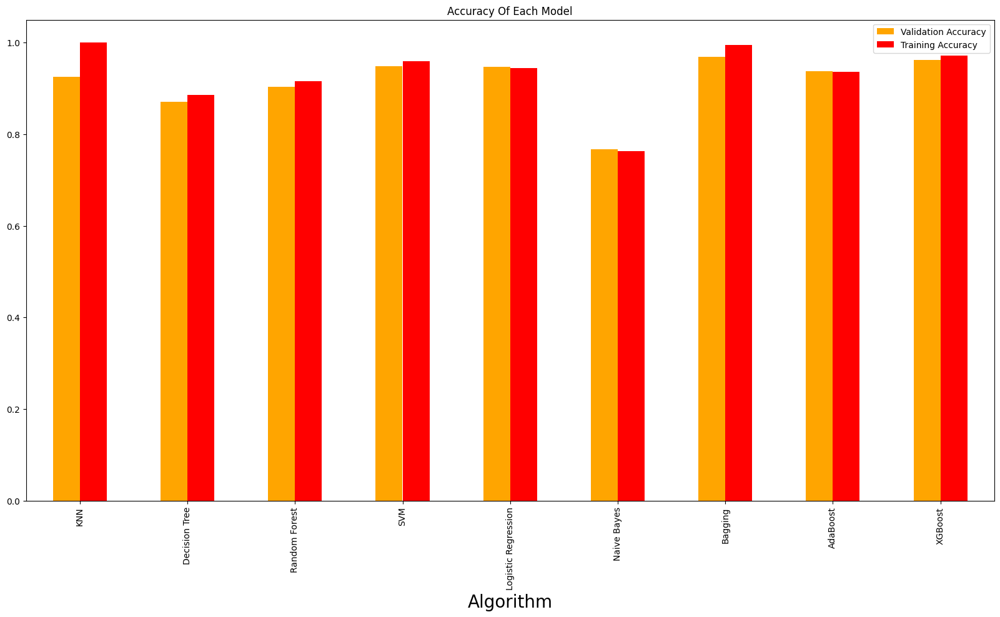

In [141]:
Result.plot(kind = 'bar', stacked = False, figsize = (20,10), color = ['orange', 'red'],x='Algorithm')
plt.title('Accuracy Of Each Model')
plt.xlabel('Algorithm',fontsize=20)
plt.legend()

**Conclusion :-**
 
The `Bagging` have maximum accuracy for both training and validation data set.So we can use to prediction on the `test data` using Bagging Model.

In [124]:
# To predict test data set on best algorithm 

test_prediction=Bag.predict(test_data)
print('Prediction of test dataset :-',test_prediction)

Prediction of test dataset :- [0 0 0 ... 0 0 1]


In [125]:
# To show prediction of test data set along with their employee_id

Test_data=pd.DataFrame({'Employee_Id':Emp_id,'Prediction Using Best Algorithm':test_prediction})
Test_data.head()

,Employee_Id,Prediction Using Best Algorithm
0,8724,0
1,74430,0
2,72255,0
3,38562,0
4,64486,0


# 9.Using Lazypredict: <a class="anchor" id="9"></a>

[Table of Contents](#0.1)

In [126]:
## To get all models & prediction in one go

LC = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = LC.fit(X_train,X_valid,Y_train,Y_valid)

100%|█| 29/29 [29:45<00:00, 61.55s/it]


In [127]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.96,0.96,0.96,0.96,14.83
XGBClassifier,0.96,0.96,0.96,0.96,12.45
BaggingClassifier,0.96,0.96,0.96,0.96,6.99
LGBMClassifier,0.96,0.96,0.96,0.96,1.52
ExtraTreesClassifier,0.96,0.96,0.96,0.96,27.48
KNeighborsClassifier,0.94,0.94,0.94,0.94,9.98
CalibratedClassifierCV,0.94,0.94,0.94,0.94,98.95
LinearSVC,0.94,0.94,0.94,0.94,23.97
SGDClassifier,0.94,0.94,0.94,0.94,1.17


# 10.Artificial Neural Network : <a class="anchor" id="10"></a>

[Table of Contents](#0.1)

The term **"Artificial Neural Network"** is derived from Biological neural networks that develop the structure of a human brain. Similar to the human brain that has neurons interconnected to one another, artificial neural networks also have neurons that are interconnected to one another in various layers of the networks. These neurons are known as nodes.

![ANN](https://static.javatpoint.com/tutorial/artificial-neural-network/images/artificial-neural-network4.png)

## Dropout :-
   Dropout layers have been the go-to method to reduce the overfitting of neural networks. It is the underworld king of regularisation in the modern era of deep learning.
![](https://miro.medium.com/v2/resize:fit:720/format:webp/1*iWQzxhVlvadk6VAJjsgXgg.png)
   
## BatchNormalization :-
   Batch Norm is a normalization technique done between the layers of a Neural Network instead of in the raw data. It is done along mini-batches instead of the full data set. It serves to speed up training and use higher learning rates, making learning easier. the standard deviation of the neurons' output.

In [22]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization

In [25]:
model = Sequential()

model.add(Dense(128,input_dim=(58,1) activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))

model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(1,activation='sigmoid'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 128)               7552      
                                                                 
 dense_10 (Dense)            (None, 128)               16512     
                                                                 
 dense_11 (Dense)            (None, 128)               16512     
                                                                 
 dense_12 (Dense)            (None, 128)               16512     
                                                                 
 dense_13 (Dense)            (None, 128)               16512     
                                                                 
 dense_14 (Dense)            (None, 128)               16512     
                                                                 
 dense_15 (Dense)            (None, 128)              

In [26]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

history = model.fit(X_train, Y_train, epochs=100, validation_data=(X_valid,Y_valid),verbose=1,batch_size=32)

Epoch 1/100
2507/2507 [==============================] - 14s 5ms/step - loss: 0.1945 - accuracy: 0.9220 - val_loss: 0.1953 - val_accuracy: 0.9340
Epoch 2/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.1642 - accuracy: 0.9345 - val_loss: 0.1484 - val_accuracy: 0.9343
Epoch 3/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.1512 - accuracy: 0.9391 - val_loss: 0.1454 - val_accuracy: 0.9446
Epoch 4/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.1431 - accuracy: 0.9428 - val_loss: 0.1280 - val_accuracy: 0.9477
Epoch 5/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.1401 - accuracy: 0.9439 - val_loss: 0.1266 - val_accuracy: 0.9486
Epoch 6/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.1371 - accuracy: 0.9454 - val_loss: 0.1480 - val_accuracy: 0.9456
Epoch 7/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.1336 - accuracy: 0.9469 - val_loss: 0.1421 -

Epoch 57/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.0771 - accuracy: 0.9697 - val_loss: 0.1465 - val_accuracy: 0.9533
Epoch 58/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.0774 - accuracy: 0.9702 - val_loss: 0.1642 - val_accuracy: 0.9486
Epoch 59/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.0757 - accuracy: 0.9706 - val_loss: 0.1490 - val_accuracy: 0.9531
Epoch 60/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.0748 - accuracy: 0.9711 - val_loss: 0.1439 - val_accuracy: 0.9545
Epoch 61/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.0743 - accuracy: 0.9714 - val_loss: 0.1558 - val_accuracy: 0.9546
Epoch 62/100
2507/2507 [==============================] - 11s 5ms/step - loss: 0.0743 - accuracy: 0.9715 - val_loss: 0.1554 - val_accuracy: 0.9531
Epoch 63/100
2507/2507 [==============================] - 12s 5ms/step - loss: 0.0728 - accuracy: 0.9722 - val_loss: 0

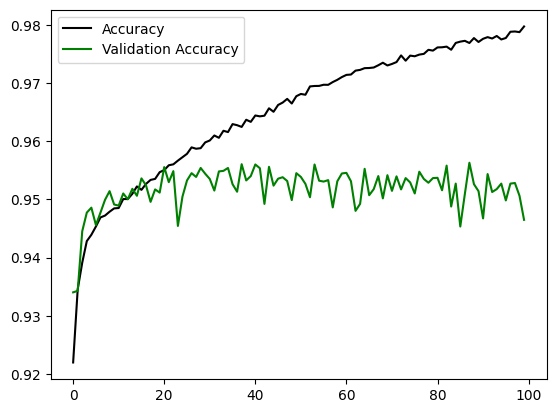

In [27]:
plt.plot(history.history['accuracy'],color='black',label="Accuracy")
plt.plot(history.history['val_accuracy'],color='green',label='Validation Accuracy')
plt.legend()
plt.show()

**Conclusion :-**
         
   In ANN we get validation accuracy is ` 95% ` and training accuracy is ` 97% ` using activation is `relu` with 128 nodes in each layer.
    

# 11. LSTM : <a class="anchor" id="11"></a>
​
[Table of Contents](#0.1)

Long Short Term Memory is a kind of recurrent neural network. In RNN output from the last step is fed as input in the current step. LSTM was designed by Hochreiter & Schmidhuber. It tackled the problem of long-term dependencies of RNN in which the RNN cannot predict the word stored in the long-term memory but can give more accurate predictions from the recent information. LSTM can by default retain the information for a long period of time. It is used for processing, predicting, and classifying on the basis of time-series data. 

![LSTM](https://media.geeksforgeeks.org/wp-content/uploads/newContent1.png)

In [22]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import LSTM,Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization

In [23]:
model_1=Sequential()

model_1.add(LSTM(128,input_shape=(58,1), activation="tanh",return_sequences=True))
model_1.add(LSTM(128,activation="tanh"))
model_1.add(Dense(128,activation='tanh'))
model_1.add(Dense(128,activation='tanh'))
model_1.add(Dense(128,activation='tanh'))
model_1.add(Dense(128,activation='tanh'))
model_1.add(Dense(1,activation='sigmoid'))

model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 58, 128)           66560     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dense (Dense)               (None, 128)               16512     
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dense_4 (Dense)             (None, 1)                 1

In [24]:
model_1.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

history_1 = model_1.fit(X_train, Y_train, epochs=100, validation_data=(X_valid,Y_valid),verbose=1,batch_size=32)

Epoch 1/100
2507/2507 [==============================] - 336s 131ms/step - loss: 0.2298 - accuracy: 0.9058 - val_loss: 0.2301 - val_accuracy: 0.9166
Epoch 2/100
2507/2507 [==============================] - 324s 129ms/step - loss: 0.2026 - accuracy: 0.9175 - val_loss: 0.1751 - val_accuracy: 0.9317
Epoch 3/100
2507/2507 [==============================] - 302s 120ms/step - loss: 0.1899 - accuracy: 0.9242 - val_loss: 0.1809 - val_accuracy: 0.9318
Epoch 4/100
2507/2507 [==============================] - 289s 115ms/step - loss: 0.1846 - accuracy: 0.9268 - val_loss: 0.1816 - val_accuracy: 0.9265
Epoch 5/100
2507/2507 [==============================] - 303s 121ms/step - loss: 0.1803 - accuracy: 0.9286 - val_loss: 0.1653 - val_accuracy: 0.9334
Epoch 6/100
2507/2507 [==============================] - 294s 117ms/step - loss: 0.1762 - accuracy: 0.9295 - val_loss: 0.1624 - val_accuracy: 0.9345
Epoch 7/100
2507/2507 [==============================] - 303s 121ms/step - loss: 0.2040 - accuracy: 0.9119

Epoch 56/100
2507/2507 [==============================] - 322s 128ms/step - loss: 0.0886 - accuracy: 0.9639 - val_loss: 0.1195 - val_accuracy: 0.9551
Epoch 57/100
2507/2507 [==============================] - 330s 132ms/step - loss: 0.0851 - accuracy: 0.9649 - val_loss: 0.1250 - val_accuracy: 0.9567
Epoch 58/100
2507/2507 [==============================] - 316s 126ms/step - loss: 0.0850 - accuracy: 0.9658 - val_loss: 0.1241 - val_accuracy: 0.9537
Epoch 59/100
2507/2507 [==============================] - 321s 128ms/step - loss: 0.0831 - accuracy: 0.9664 - val_loss: 0.1308 - val_accuracy: 0.9541
Epoch 60/100
2507/2507 [==============================] - 315s 126ms/step - loss: 0.0804 - accuracy: 0.9665 - val_loss: 0.1469 - val_accuracy: 0.9540
Epoch 61/100
2507/2507 [==============================] - 317s 127ms/step - loss: 0.0808 - accuracy: 0.9670 - val_loss: 0.1330 - val_accuracy: 0.9552
Epoch 62/100
2507/2507 [==============================] - 321s 128ms/step - loss: 0.0781 - accuracy:

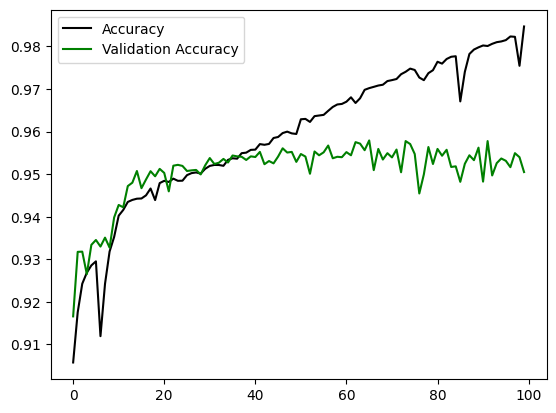

In [29]:
plt.plot(history_1.history['accuracy'],color='black',label="Accuracy")
plt.plot(history_1.history['val_accuracy'],color='green',label='Validation Accuracy')
plt.legend()
plt.show()

**Conclusion :-**
         
   In LSTM we get validation accuracy is ` 95% ` and training accuracy is ` 98% ` using activation is `tanh` with 128 nodes in each layer.
    

# 12.Result and Conclusion: <a class="anchor" id="12"></a>

[Table of Contents](#0.1)

- In this project, I have implemented the most popular supervised classification algorithms like `KNN` , `Decision Tree` , `Random Forest` , `SVM` , `Logistic Regression` , `Naive Bayes` , `Bagging` , `AdaBoasting` , `XGBoasting`.

- I have applied the `Randomized Search Cv` and find that hyperparameter to each algorithm can be considered a good parameter this data.

- I have find that the model has very high accuracy with 97 % by `Bagging` model.

- For test data the prediction will do on best algorithm among all.  i.e. Bagging classifier.

- I have achieved a very weak accuracy with 77 %  by our `Naive Bayes` model.

- Using `ANN` we get validation accuracy is 94% and training accuracy is 97%.

- Using `LSTM` we get validation accuracy is 95% and training accuracy is 98%.
